## Analyzing the Impact of External Factors on Retail Store Sales: A Regression Analysis

### Introduction
In the dynamic landscape of retail, understanding the myriad factors that drive store sales has become paramount for businesses aiming to achieve sustained growth and profitability. Sales performance could be influenced not only by internal strategies and product offerings but also by a complex interplay of external factors. These external variables, ranging from economic indicators and climatic conditions to holidays and marketing endeavors, can exert substantial influence on consumer behavior and purchasing patterns. As the retail industry continues to evolve, there is a pressing need to uncover the relationships between these external factors and store sales with a higher degree of precision. This study aims to contribute to this understanding through a rigorous regression analysis, offering insights that can empower retail companies to make informed decisions and optimize their strategies for enhanced sales outcomes.

### Problem Statement
The central problem under investigation in this study is to ascertain the extent to which external factors impact the sales performance of retail stores. While it is widely acknowledged that both internal and external factors contribute to sales fluctuations, there remains a gap in comprehending the specific nature and magnitude of these external influences. Existing research has shown that factors such as economic indicators, weather variations, promotional campaigns, and cultural events can impact consumer spending behavior. However, there is a lack of comprehensive empirical analysis that quantifies the relationships between these external variables and store sales within a unified framework.

### Aim of Project
The aim of this project is to investigate how certain external factors such as oil prices, holiday-events, and natural ocurrances impact the sales of products of Favorita Retail Stores in Ecuador.

## Set Up The Project Environment

Install the necessary Python libraries: pandas, numpy, scikit-learn, matplotlib, and any specific time series libraries like statsmodels.

In [1]:
# Load the libraries/modules

# For data manipulation and cleaning
import pandas as pd # a tool for data analysis and manipulation.
import numpy as np # a tool for numerical computations.
from datetime import datetime

# For data visualizations
import matplotlib.pyplot as plt # a tool for ploting graphs/charts.
import plotly.express as px
import seaborn as sns # a tool built on matplotlib for plotting graphs/charts.

# For imputing missing values
from sklearn.impute import SimpleImputer

# For encoding numerical, categorical data, creating a pipeline and converting back to Dataframe
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder,MinMaxScaler
from sklearn.compose import make_column_selector
from scipy.sparse import csr_matrix

# For Statistical analysis and testing
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.stats.diagnostic import acorr_ljungbox

# Perform Stationarity Test
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math

# For model selections and modeling
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error, mean_squared_error
import phik
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
from sklearn.tree import DecisionTreeRegressor
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from math import sqrt


# Other supporting libraries
import random
import pyodbc #  helps in making access to SQL Server database simple.
from dotenv import dotenv_values # helps to get login credential to the database.

import warnings # Hiding not too major the warnings.
warnings.filterwarnings('ignore')


In [2]:
# Create an environment to store sentitive information
environment_variables = dotenv_values('.env')

database_name = environment_variables.get('DATABASE')
server_name   = environment_variables.get('SERVER')
user_name     = environment_variables.get('UID')
password      = environment_variables.get('PWD')

connection_string = f'DRIVER={{SQL Server}};DATABASE={database_name};SERVER={server_name};UID={user_name};PWD={password};'

In [3]:
# Connecting to the Database
connection = pyodbc.connect(connection_string)

In [4]:
# Loading the data in pandas to work on.

# Queries to retrieve tables from the Database dapDB
query1 ='SELECT * FROM dbo.oil'
query2 ='SELECT * FROM dbo.holidays_events'
query3 ='SELECT * FROM dbo.stores'

# Redefine datatypes
dtypes = {'id':'int64', 'store_nbr':'int8', 'onpromotion': str}

#Loading the data from the Database dapDB
oil_data = pd.read_sql(query1, connection, parse_dates=['date'])
holi_eve_data = pd.read_sql(query2, connection, parse_dates=['date'], dtype={'transferred': str})
stores_data = pd.read_sql(query3, connection)

#Loading the two data stored in Onedrive
sample_sub_data = pd.read_csv('C:\\Users\\etnketiah\\Documents\\Azubi\\New project\\Lp3pro\\sample_submission.csv')


test_data = pd.read_csv(r'C:/Users\etnketiah/Documents/Azubi/New project/Lp3pro/test.csv', parse_dates=['date'], dtype=dtypes)

# Loading the two data stored in GitHub
train_data = pd.read_csv(r'C:/Users/etnketiah/Documents/Azubi/New project/Lp3pro/train.csv', parse_dates=['date'], dtype=dtypes)
transc_data = pd.read_csv(r'C:/Users/etnketiah/Documents/Azubi/New project/Lp3pro/transactions.csv', parse_dates=['date'])

## Data Preprocessing

### Sample submission data

In [5]:
sample_sub_data.head()

,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0


In [6]:
sample_sub_data.shape

(28512, 2)

In [7]:
sample_sub_data.isna().sum()

id       0
sales    0
dtype: int64

In [8]:
sample_sub_data.duplicated().sum()

0

In [9]:
sample_sub_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      28512 non-null  int64  
 1   sales   28512 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 445.6 KB


### Oil data

In [10]:
oil_data.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.139999
2,2013-01-03,92.970001
3,2013-01-04,93.120003
4,2013-01-07,93.199997


In [11]:
oil_data.shape

(1218, 2)

In [12]:
oil_data.isna().sum()

date           0
dcoilwtico    43
dtype: int64

In [13]:
oil_data.duplicated().sum()

0

In [14]:
oil_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1218 non-null   datetime64[ns]
 1   dcoilwtico  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB


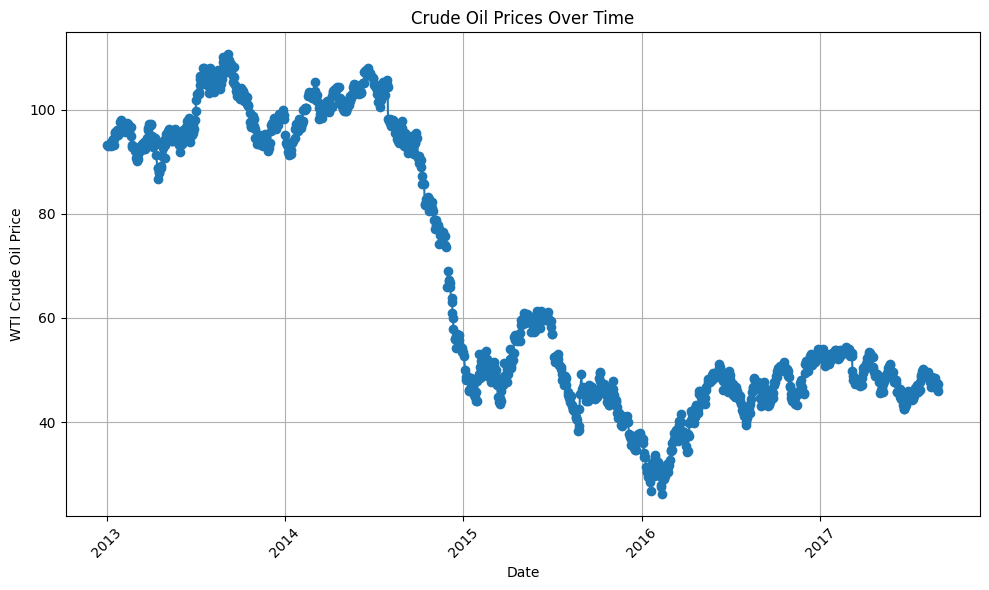

In [15]:
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(oil_data['date'], oil_data['dcoilwtico'], marker='o', linestyle='-')
plt.title('Crude Oil Prices Over Time')
plt.xlabel('Date')
plt.ylabel('WTI Crude Oil Price')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

### Store dataset

In [16]:
stores_data.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [17]:
stores_data['city'].unique()

array(['Quito', 'Santo Domingo', 'Cayambe', 'Latacunga', 'Riobamba',
       'Ibarra', 'Guaranda', 'Puyo', 'Ambato', 'Guayaquil', 'Salinas',
       'Daule', 'Babahoyo', 'Quevedo', 'Playas', 'Libertad', 'Cuenca',
       'Loja', 'Machala', 'Esmeraldas', 'Manta', 'El Carmen'],
      dtype=object)

In [18]:
stores_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [19]:
stores_data.isna().sum()

store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64

In [20]:
stores_data.duplicated().sum()

0

In [21]:
stores_data['type'].unique()

array(['D', 'B', 'C', 'E', 'A'], dtype=object)

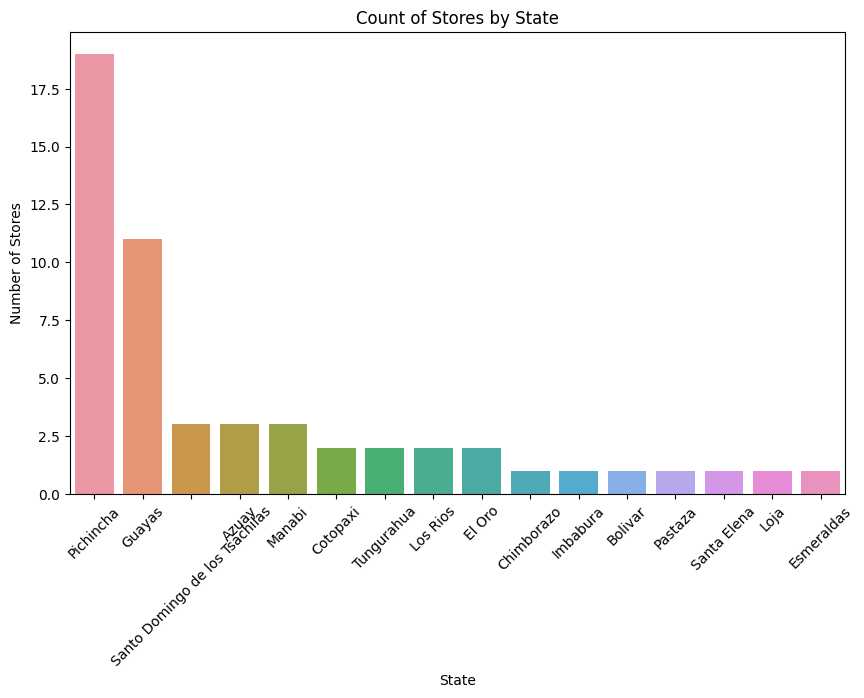

In [22]:
# Count of stores by state
stores_by_state = stores_data['state'].value_counts().reset_index()

# Plot the graph
plt.figure(figsize=(10, 6))
sns.barplot(data=stores_by_state, x='state', y='count')
plt.title('Count of Stores by State')
plt.xlabel('State')
plt.ylabel('Number of Stores')
plt.xticks(rotation=45)

# Show
plt.show()

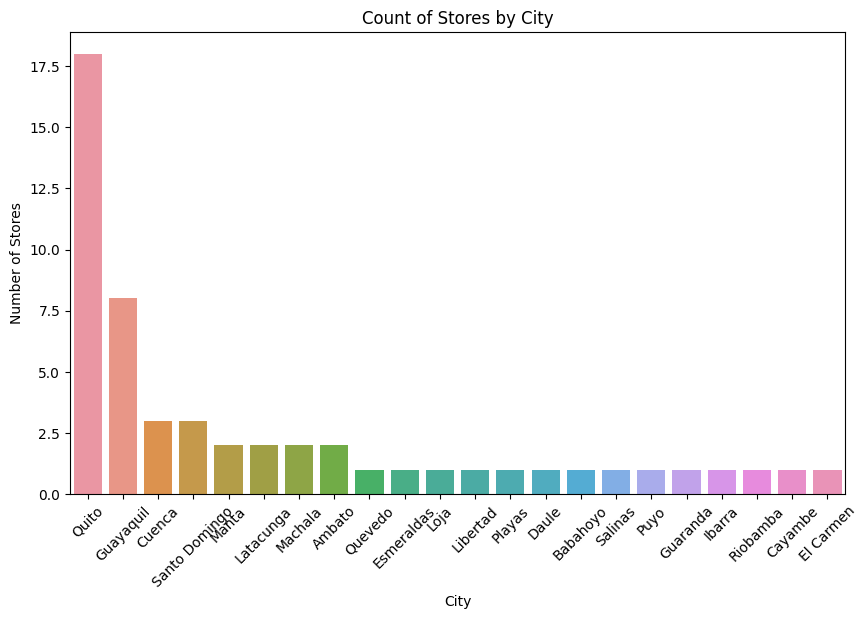

In [23]:
# Count of stores by city
stores_by_city = stores_data['city'].value_counts().reset_index()

# Plot the graph
plt.figure(figsize=(10, 6))
sns.barplot(data=stores_by_city, x='city', y='count')
plt.title('Count of Stores by City')
plt.xlabel('City')
plt.ylabel('Number of Stores')
plt.xticks(rotation=45)

# Show
plt.show()

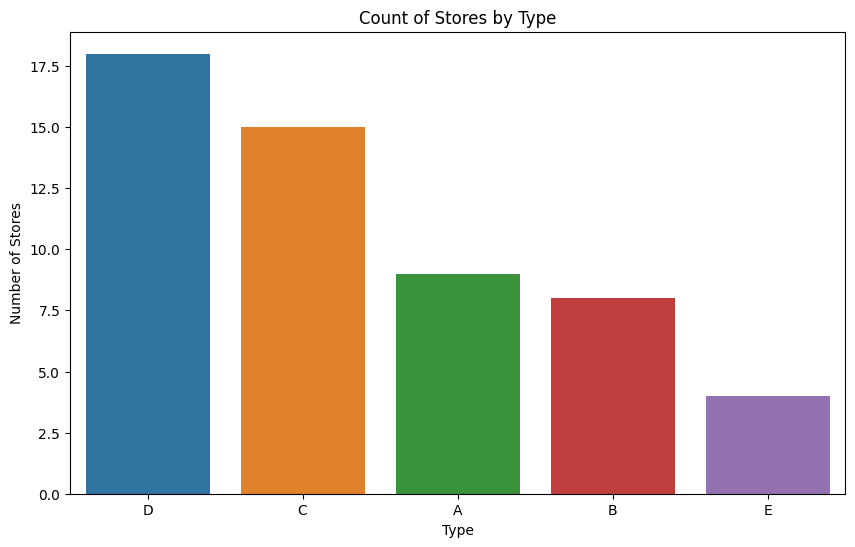

In [24]:
# Count of stores by type
stores_by_type = stores_data['type'].value_counts().reset_index()

# Plot the graph
plt.figure(figsize=(10, 6))
sns.barplot(data=stores_by_type, x='type', y='count')
plt.title('Count of Stores by Type')
plt.xlabel('Type')
plt.ylabel('Number of Stores')

# Show
plt.show()

### Holiday/Events dataset

In [25]:
holi_eve_data.head(5)

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [26]:
holi_eve_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    object        
dtypes: datetime64[ns](1), object(5)
memory usage: 16.5+ KB


In [27]:
holi_eve_data.isna().sum()

date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64

In [28]:
holi_eve_data.duplicated().sum()

0

In [29]:
holi_eve_data.shape

(350, 6)

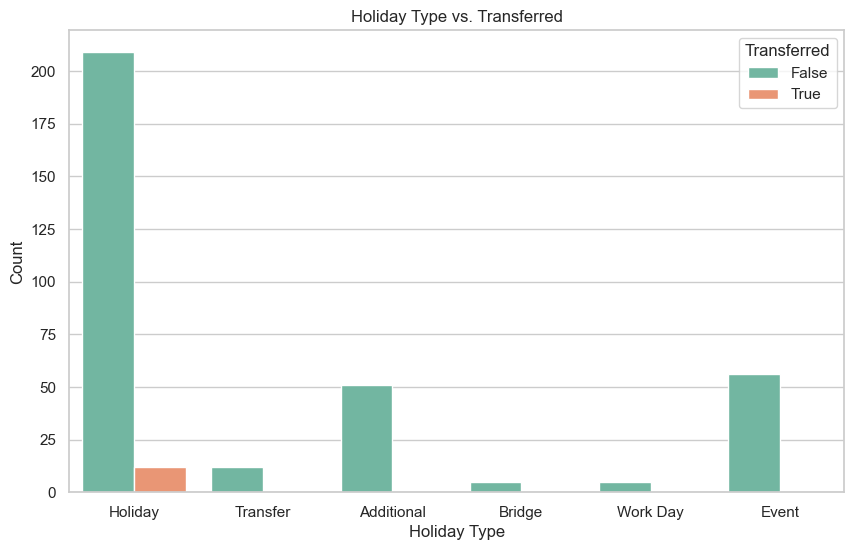

In [30]:
# Create a Seaborn style plot
sns.set(style='whitegrid')
plt.figure(figsize=(10, 6))

# Plot the data using Seaborn
sns.countplot(data=holi_eve_data, x='type', hue='transferred', palette='Set2')
plt.title('Holiday Type vs. Transferred')
plt.xlabel('Holiday Type')
plt.ylabel('Count')
plt.legend(title='Transferred')

# Show the plot
plt.show()

### Transaction Dataset

In [31]:
transc_data.head()

,date,store_nbr,transactions
0,2013-01-01,25,770.0
1,2013-01-02,1,2111.0
2,2013-01-02,2,2358.0
3,2013-01-02,3,3487.0
4,2013-01-02,4,1922.0


In [32]:
transc_data.shape

(6446, 3)

In [33]:
transc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6446 entries, 0 to 6445
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          6446 non-null   datetime64[ns]
 1   store_nbr     6446 non-null   int64         
 2   transactions  6445 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 151.2 KB


In [34]:
transc_data.isna().sum()

date            0
store_nbr       0
transactions    1
dtype: int64

In [35]:
transc_data.duplicated().sum()

0

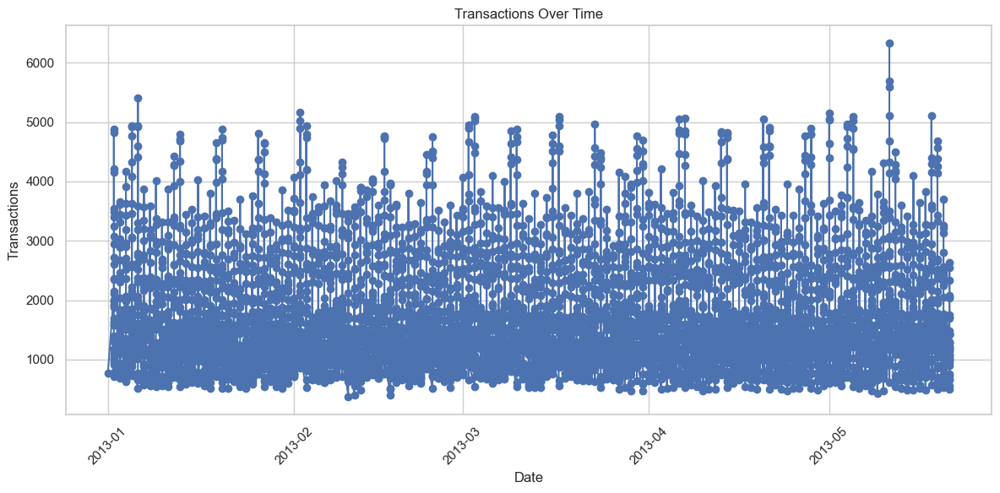

In [36]:
# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(transc_data['date'], transc_data['transactions'], marker='o', linestyle='-')
plt.title('Transactions Over Time')
plt.xlabel('Date')
plt.ylabel('Transactions')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

In [37]:
# Find the maximum and minimum dates
max_date = transc_data['date'].max()
min_date = transc_data['date'].min()

print("Maximum Date:", max_date)
print("Minimum Date:", min_date)

Maximum Date: 2013-05-21 00:00:00
Minimum Date: 2013-01-01 00:00:00


### Train dataset

In [38]:
# take a look at the first 5 rows of the data
train_data.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [39]:
# view the dimension of the data
train_data.shape

(3000888, 6)

In [40]:
# checking the nan values in each column
train_data.isna().sum()

id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

In [41]:
# checking for duplicates in the data 
train_data.duplicated().sum()

0

In [42]:
# view the data information
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int8          
 3   family       object        
 4   sales        float64       
 5   onpromotion  object        
dtypes: datetime64[ns](1), float64(1), int64(1), int8(1), object(2)
memory usage: 117.3+ MB


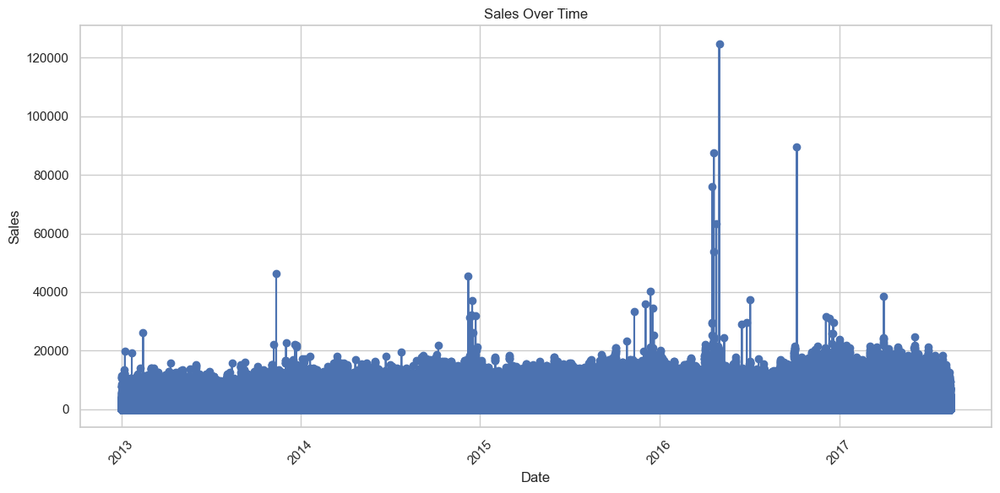

In [43]:
# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(train_data['date'], train_data['sales'], marker='o', linestyle='-')
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

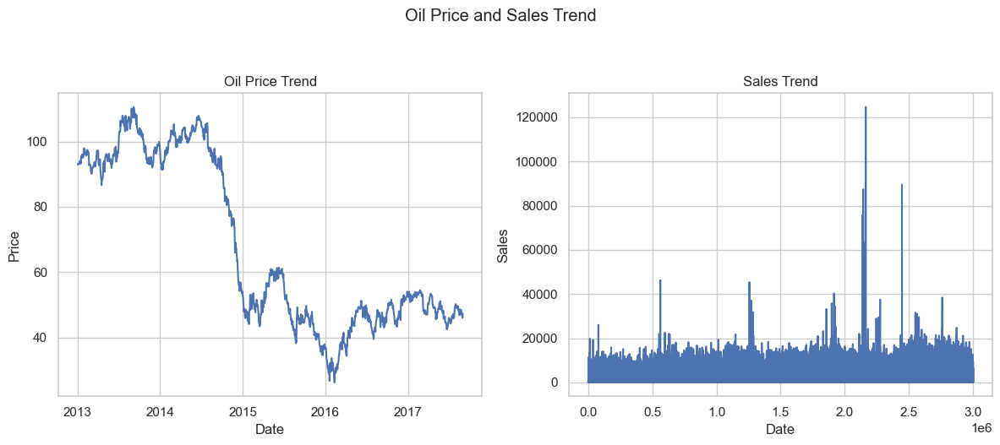

In [44]:
# Comparing the trend of oil price and the trend of sales

# Create subplots with 1 row and 2 columns
plt.figure(figsize=(12, 5)) 

# Create the first subplot in a 1x2 grid
plt.subplot(1, 2, 1)

# Create a line plot for oil price
sns.lineplot(data=oil_data, x='date', y='dcoilwtico')  
plt.title('Oil Price Trend') 
plt.xlabel('Date') 
plt.ylabel('Price') 

 # Create the second subplot in a 1x2 grid
plt.subplot(1, 2, 2) 

# Create a line plot for sales trend
sns.lineplot(data=train_data, x=train_data.index, y='sales')  
plt.title('Sales Trend')  
plt.xlabel('Date') 
plt.ylabel('Sales')

# Set the common title above the subplots
plt.suptitle('Oil Price and Sales Trend', y=1.05)

# Adjust subplot layout for better spacing
plt.tight_layout() 

# Display the plot
plt.show()

## DATA ASSESSMENT

Following data gathering from various sources, a comprehensive assessment was conducted to evaluate quality issues both visually and programmatically.

### DATA QUALITY ISSUES


During the preliminary dataset exploration, several data quality issues were identified, and they are summarized below:

   
1. Completeness:
   - Missing data points in the dcoilwtico column of the oil dataset.


### Hypothesis 
Null Hypothesis (H0):
External factors have no significant impact on retail store sales.

Alternative Hypothesis (H1):
External factors have a significant impact on retail store sales.

### RATIONALE

The rationale for testing these hypotheses is to determine whether there is empirical evidence to support the idea that promotions have a meaningful impact on sales in supermarkets.

By testing these hypotheses and examining the correlation between promotions and sales, businesses can gain valuable insights into the dynamics of supermarket sales and make evidence-based decisions regarding their promotional strategies.

### DATA CLEANING

In [45]:
# Rename the column 'dcoilwtico' to 'oil price'
oil_data.rename(columns={'dcoilwtico': 'oil price'}, inplace=True)

# Rename the column 'type' to 'Holiday Type'
holi_eve_data.rename(columns={'type': 'Holiday Type'}, inplace=True)

# Rename the column 'type' to 'Store Type'
stores_data.rename(columns={'type': 'Store Type'}, inplace=True)

# Rename the 'family' column
train_data.rename(columns={'family': 'Product'}, inplace=True)

In [46]:
# Fill NaN values in the 'dcoilwtico' column using forward-fill (pad)
oil_data['oil price'].fillna(method='ffill', inplace=True)

# Display the DataFrame with filled NaN values
print(oil_data)

           date  oil price
0    2013-01-01        NaN
1    2013-01-02  93.139999
2    2013-01-03  92.970001
3    2013-01-04  93.120003
4    2013-01-07  93.199997
...         ...        ...
1213 2017-08-25  47.650002
1214 2017-08-28  46.400002
1215 2017-08-29  46.459999
1216 2017-08-30  45.959999
1217 2017-08-31  47.259998

[1218 rows x 2 columns]


In [47]:
# Create a date range from the earliest date to the latest date in the dataset
earliest_date = oil_data['date'].min()
latest_date = oil_data['date'].max()
date_range = pd.date_range(start=earliest_date, end=latest_date)

# Find the missing dates by subtracting the existing dates from the full date range
missing_dates = date_range[~date_range.isin(oil_data['date'])]

# Print the missing dates
print("Missing Dates:")
print(missing_dates)

Missing Dates:
DatetimeIndex(['2013-01-05', '2013-01-06', '2013-01-12', '2013-01-13',
               '2013-01-19', '2013-01-20', '2013-01-26', '2013-01-27',
               '2013-02-02', '2013-02-03',
               ...
               '2017-07-29', '2017-07-30', '2017-08-05', '2017-08-06',
               '2017-08-12', '2017-08-13', '2017-08-19', '2017-08-20',
               '2017-08-26', '2017-08-27'],
              dtype='datetime64[ns]', length=486, freq=None)


In [48]:
# Create a date range from the earliest date to the latest date in the dataset
earliest_date = oil_data['date'].min()
latest_date = oil_data['date'].max()
date_range = pd.date_range(start=earliest_date, end=latest_date)

# Find the missing dates by subtracting the existing dates from the full date range
missing_dates = date_range[~date_range.isin(oil_data['date'])]

# Create a DataFrame for missing dates with 'dcoilwtico' column filled using forward-fill
missing_data = pd.DataFrame({'date': missing_dates})
missing_data['oil price'] = missing_data['date'].map(oil_data.set_index('date')['oil price'].fillna(method='ffill'))

# Concatenate the original data with the missing data
oil_data = pd.concat([oil_data, missing_data], ignore_index=True)

# Sort the DataFrame by date
oil_data.sort_values(by='date', inplace=True)

# Display the updated DataFrame
print(oil_data)

           date  oil price
0    2013-01-01        NaN
1    2013-01-02  93.139999
2    2013-01-03  92.970001
3    2013-01-04  93.120003
1218 2013-01-05        NaN
...         ...        ...
1703 2017-08-27        NaN
1214 2017-08-28  46.400002
1215 2017-08-29  46.459999
1216 2017-08-30  45.959999
1217 2017-08-31  47.259998

[1704 rows x 2 columns]


In [49]:
# Sort the DataFrame by date (if it's not already sorted)
oil_data.sort_values(by='date', inplace=True)

# Fill NaN values in the 'dcoilwtico' column using forward-fill (pad)
oil_data['oil price'].fillna(method='ffill', inplace=True)

# Display the DataFrame with filled NaN values
print(oil_data)

           date  oil price
0    2013-01-01        NaN
1    2013-01-02  93.139999
2    2013-01-03  92.970001
3    2013-01-04  93.120003
1218 2013-01-05  93.120003
...         ...        ...
1703 2017-08-27  47.650002
1214 2017-08-28  46.400002
1215 2017-08-29  46.459999
1216 2017-08-30  45.959999
1217 2017-08-31  47.259998

[1704 rows x 2 columns]


In [50]:
# Sort the DataFrame by date (if it's not already sorted)
oil_data.sort_values(by='date', inplace=True)

# Fill NaN values in the 'dcoilwtico' column using forward-fill (pad)
oil_data['oil price'].fillna(method='bfill', inplace=True)

# Display the DataFrame with filled NaN values
print(oil_data)

           date  oil price
0    2013-01-01  93.139999
1    2013-01-02  93.139999
2    2013-01-03  92.970001
3    2013-01-04  93.120003
1218 2013-01-05  93.120003
...         ...        ...
1703 2017-08-27  47.650002
1214 2017-08-28  46.400002
1215 2017-08-29  46.459999
1216 2017-08-30  45.959999
1217 2017-08-31  47.259998

[1704 rows x 2 columns]


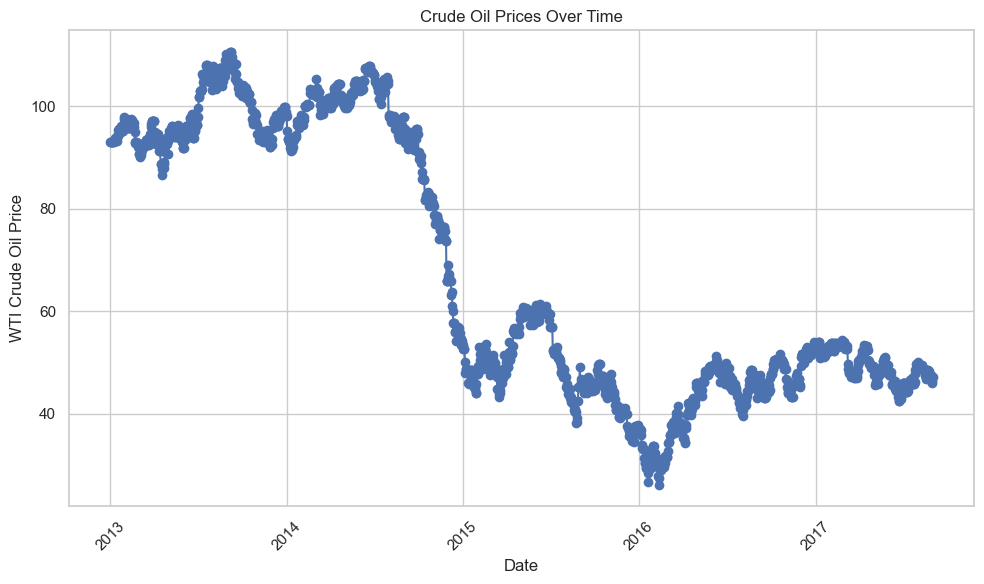

In [51]:
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(oil_data['date'], oil_data['oil price'], marker='o', linestyle='-')
plt.title('Crude Oil Prices Over Time')
plt.xlabel('Date')
plt.ylabel('WTI Crude Oil Price')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

2. Which dates have the lowest and highest sales for each year?

In [52]:
 # Group by year and find the row with the lowest sales for each year
lowest_sales_dates = train_data.loc[train_data.groupby(train_data['date'].dt.year)['sales'].idxmin()]

# Group by year and find the row with the highest sales for each year
highest_sales_dates = train_data.loc[train_data.groupby(train_data['date'].dt.year)['sales'].idxmax()]

# Display the results
print("Dates with lowest sales for each year:")
print(lowest_sales_dates[['date', 'sales']])

print("\nDates with highest sales for each year:")
print(highest_sales_dates[['date', 'sales']])

Dates with lowest sales for each year:
              date  sales
0       2013-01-01    0.0
648648  2014-01-01    0.0
1297296 2015-01-01    0.0
1945944 2016-01-01    0.0
2596374 2017-01-01    0.0

Dates with highest sales for each year:
              date       sales
562596  2013-11-12   46271.000
1257246 2014-12-08   45361.000
1916586 2015-12-14   40351.460
2163723 2016-05-02  124717.000
2760297 2017-04-02   38422.625


From the analysis above, the lowest sales of 0.0 were recorded on January 1st.
across all the years that is 2013, 2014, 2015, 2016, and 2017. 


* In the year 2013, the highest sales of 46,271.000 occurred on November 12th.

* In 2014, the highest sales of 45,361.000 were achieved on December 8th.
* The year 2015 saw the highest sales of 40,351.460 on December 14th.
* The peak sales of 124,717.000 were attained on May 2nd in 2016.
* Lastly, the highest sales of 38,422.625 were recorded on April 2nd in 2017.

### Train dataset merging 

In [53]:
# Define a function that check the matching columns across all the dataset 

# Define a Class that assigns the name to the Dataset
class NamedDataFrame(pd.DataFrame):
    def __init__(self, *args, name=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.name = name

# Define a function that output the matching pairs
def find_matching_columns_in_pairs(df:list):
    for df1_idx, (df1, df1_name) in enumerate(df):
        for df2_idx, (df2, df2_name) in enumerate(df):
            if df1_idx < df2_idx:
                common_columns = [i for i in df1.columns if any(i in j for j in df2.columns)]

                print(f"Matching columns between {df1_name} and {df2_name}: {common_columns}")

In [54]:
# Define the dataset names
datasets = [
    (oil_data, 'Oil'),
    (holi_eve_data, 'Holidays Events'),
    (stores_data, 'Stores'),
    (transc_data, 'Transactions'),
    (train_data, 'Train'),
    (test_data, 'Test'),
]

# Apply the function to check the pairs
find_matching_columns_in_pairs(datasets)

Matching columns between Oil and Holidays Events: ['date']
Matching columns between Oil and Stores: []
Matching columns between Oil and Transactions: ['date']
Matching columns between Oil and Train: ['date']
Matching columns between Oil and Test: ['date']
Matching columns between Holidays Events and Stores: []
Matching columns between Holidays Events and Transactions: ['date']
Matching columns between Holidays Events and Train: ['date']
Matching columns between Holidays Events and Test: ['date']
Matching columns between Stores and Transactions: ['store_nbr']
Matching columns between Stores and Train: ['store_nbr']
Matching columns between Stores and Test: ['store_nbr']
Matching columns between Transactions and Train: ['date', 'store_nbr']
Matching columns between Transactions and Test: ['date', 'store_nbr']
Matching columns between Train and Test: ['id', 'date', 'store_nbr', 'onpromotion']


In [55]:
# Define a function that compares the two dates and also check the date range
def date_comparison(date_column1, date_column2):
    """
    Compare two date columns and print counts and date ranges.
    
    Parameters:
    - date_column1: The first date column (as a pandas Series).
    - date_column2: The second date column (as a pandas Series).

    Returns:
    - A dictionary containing the count of common and uncommon dates, as well as date ranges.
    """
    # Convert date columns to sets for faster set operations
    dates1 = set(date_column1)
    dates2 = set(date_column2)

    # Find common dates
    common_dates = dates1.intersection(dates2)
    count_common = len(common_dates)

    # Find uncommon dates
    uncommon_dates = dates1.symmetric_difference(dates2)
    count_uncommon = len(uncommon_dates)

    # Find date range for dates1 dataset
    date_range1 = (min(dates1), max(dates1))

    # Find date range for dates2 dataset
    date_range2 = (min(dates2), max(dates2))

    # Store the counts and date ranges in a dictionary
    results = {
        'Common': count_common,
        'Uncommon': count_uncommon,
        'Date Range 1': date_range1,
        'Date Range 2': date_range2
    }

    return results

In [56]:
# Apply the function to compare for Transaction and Train
compare_result_train= date_comparison(transc_data['date'], train_data['date'])

# print
pd.DataFrame(compare_result_train)

,Common,Uncommon,Date Range 1,Date Range 2
0,141,1543,2013-01-01,2013-01-01
1,141,1543,2013-05-21,2017-08-15


In [57]:
trainQ = train_data
# Merge stores_data based on 'store_nbr'
trainQ = pd.merge(trainQ, stores_data, on='store_nbr', how='left')

# Merge oil_data on 'date'
trainQ = pd.merge(trainQ, oil_data, on='date', how='left')

# Merge Holiday with train data
trainQ = pd.merge(trainQ, holi_eve_data, on='date', how='left')

In [58]:
# Set the 'date' as index for easy analysis
trainQ.set_index('date', inplace=True)

# Split the 'date' index into Year, Month and Day
# Extract Year, Half a Year, Quarter, Month, 2-week period, week, and Day
trainQ['Year'] = trainQ.index.year
trainQ['Half Year'] = (trainQ.index.month - 1) // 6 + 1
trainQ['Quarter'] = trainQ.index.quarter
trainQ['Month'] = trainQ.index.month
trainQ['2 Weeks'] = (trainQ.index.day - 1) // 14 + 1
trainQ['Day'] = trainQ.index.day

In [59]:

train_mod = train_data.copy()
train_mod = train_data.merge(oil_data, on=['date'])

In [60]:
# Merge holidays events, stores and transactions to the Train
train_mod = train_mod.merge(stores_data, on=['store_nbr'])
train_mod = train_mod.merge(holi_eve_data, on=['date'])
train_mod = train_mod.merge(transc_data, on=['date', 'store_nbr'])

In [61]:
train_mod

,id,date,store_nbr,Product,sales,onpromotion,oil price,city,state,Store Type,cluster,Holiday Type,locale,locale_name,description,transferred,transactions
0,561,2013-01-01,25,AUTOMOTIVE,0.000,0,93.139999,Salinas,Santa Elena,D,1,Holiday,National,Ecuador,Primer dia del ano,False,770.0
1,562,2013-01-01,25,BABY CARE,0.000,0,93.139999,Salinas,Santa Elena,D,1,Holiday,National,Ecuador,Primer dia del ano,False,770.0
2,563,2013-01-01,25,BEAUTY,2.000,0,93.139999,Salinas,Santa Elena,D,1,Holiday,National,Ecuador,Primer dia del ano,False,770.0
3,564,2013-01-01,25,BEVERAGES,810.000,0,93.139999,Salinas,Santa Elena,D,1,Holiday,National,Ecuador,Primer dia del ano,False,770.0
4,565,2013-01-01,25,BOOKS,0.000,0,93.139999,Salinas,Santa Elena,D,1,Holiday,National,Ecuador,Primer dia del ano,False,770.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21379,235221,2013-05-12,9,PRODUCE,0.000,0,95.809998,Quito,Pichincha,B,6,Event,National,Ecuador,Dia de la Madre,False,2337.0
21380,235222,2013-05-12,9,SCHOOL AND OFFICE SUPPLIES,0.000,0,95.809998,Quito,Pichincha,B,6,Holiday,Local,Puyo,Cantonizacion del Puyo,False,2337.0
21381,235222,2013-05-12,9,SCHOOL AND OFFICE SUPPLIES,0.000,0,95.809998,Quito,Pichincha,B,6,Event,National,Ecuador,Dia de la Madre,False,2337.0
21382,235223,2013-05-12,9,SEAFOOD,28.907,0,95.809998,Quito,Pichincha,B,6,Holiday,Local,Puyo,Cantonizacion del Puyo,False,2337.0


In [62]:
train_mod.isnull().sum()

id              0
date            0
store_nbr       0
Product         0
sales           0
onpromotion     0
oil price       0
city            0
state           0
Store Type      0
cluster         0
Holiday Type    0
locale          0
locale_name     0
description     0
transferred     0
transactions    0
dtype: int64

In [63]:
# Get more info
train_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21384 entries, 0 to 21383
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   id            21384 non-null  int64         
 1   date          21384 non-null  datetime64[ns]
 2   store_nbr     21384 non-null  int8          
 3   Product       21384 non-null  object        
 4   sales         21384 non-null  float64       
 5   onpromotion   21384 non-null  object        
 6   oil price     21384 non-null  float64       
 7   city          21384 non-null  object        
 8   state         21384 non-null  object        
 9   Store Type    21384 non-null  object        
 10  cluster       21384 non-null  int64         
 11  Holiday Type  21384 non-null  object        
 12  locale        21384 non-null  object        
 13  locale_name   21384 non-null  object        
 14  description   21384 non-null  object        
 15  transferred   21384 non-null  object

In [64]:
# Generate summary statistics
train_mod.describe()

,id,date,store_nbr,sales,oil price,cluster,transactions
count,21384.000000,21384,21384.000000,21384.000000,21384.000000,21384.000000,21384.000000
mean,152750.694444,2013-03-27 05:20:00,26.347222,273.584794,93.707484,8.538580,1855.564815
min,561.000000,2013-01-01 00:00:00,1.000000,0.000000,88.040001,1.000000,396.000000
25%,75734.750000,2013-02-12 00:00:00,12.000000,0.000000,91.230003,4.000000,1129.250000
50%,183578.500000,2013-04-14 00:00:00,27.000000,4.000000,94.089996,9.000000,1476.000000
75%,214804.500000,2013-05-01 00:00:00,40.000000,159.997000,95.809998,13.000000,2373.750000
max,235223.000000,2013-05-12 00:00:00,54.000000,13027.000000,97.480003,17.000000,6328.000000
std,77353.584746,NaN,15.699647,856.064158,2.830991,4.839355,1073.985508


In [65]:
# Get the unique years contained in the dataset
train_mod['date'].dt.year.unique()

array([2013])

From the output above, The dataset contains information spanning across five consecutive years, namely 2013, 2014, 2015, 2016, and 2017. 

In [66]:
# Decompose the date column into Year, Year-Month, Month and Day to facilitate deep analysis
# year
train_mod['year'] = train_mod.date.dt.year

# year-month
train_mod['year-month'] = train_mod['date'].apply(lambda x : x.strftime('%Y-%m'))

# month
train_mod['month'] = train_mod.date.dt.month

# day
train_mod['day'] = train_mod.date.dt.day

In [67]:
# Confirm changes
train_mod.head()

,id,date,store_nbr,Product,sales,onpromotion,oil price,city,state,Store Type,...,Holiday Type,locale,locale_name,description,transferred,transactions,year,year-month,month,day
0,561,2013-01-01,25,AUTOMOTIVE,0.0,0,93.139999,Salinas,Santa Elena,D,...,Holiday,National,Ecuador,Primer dia del ano,False,770.0,2013,2013-01,1,1
1,562,2013-01-01,25,BABY CARE,0.0,0,93.139999,Salinas,Santa Elena,D,...,Holiday,National,Ecuador,Primer dia del ano,False,770.0,2013,2013-01,1,1
2,563,2013-01-01,25,BEAUTY,2.0,0,93.139999,Salinas,Santa Elena,D,...,Holiday,National,Ecuador,Primer dia del ano,False,770.0,2013,2013-01,1,1
3,564,2013-01-01,25,BEVERAGES,810.0,0,93.139999,Salinas,Santa Elena,D,...,Holiday,National,Ecuador,Primer dia del ano,False,770.0,2013,2013-01,1,1
4,565,2013-01-01,25,BOOKS,0.0,0,93.139999,Salinas,Santa Elena,D,...,Holiday,National,Ecuador,Primer dia del ano,False,770.0,2013,2013-01,1,1


In [68]:
# Check distinct month
sorted(train_mod['month'].unique())

[1, 2, 3, 4, 5]

In [69]:
# Convert onpromotion to int
train_mod['onpromotion'] = train_mod['onpromotion'].astype('int')

### Analysis

In [70]:
train_data

,id,date,store_nbr,Product,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


## Answering the rest of Questions and Hypothesis

3. Did the earthquake impact sales?


In [71]:
trainQ.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3054348 entries, 2013-01-01 to 2017-08-15
Data columns (total 21 columns):
 #   Column        Dtype  
---  ------        -----  
 0   id            int64  
 1   store_nbr     int8   
 2   Product       object 
 3   sales         float64
 4   onpromotion   object 
 5   city          object 
 6   state         object 
 7   Store Type    object 
 8   cluster       int64  
 9   oil price     float64
 10  Holiday Type  object 
 11  locale        object 
 12  locale_name   object 
 13  description   object 
 14  transferred   object 
 15  Year          int32  
 16  Half Year     int32  
 17  Quarter       int32  
 18  Month         int32  
 19  2 Weeks       int32  
 20  Day           int32  
dtypes: float64(2), int32(6), int64(2), int8(1), object(10)
memory usage: 422.4+ MB


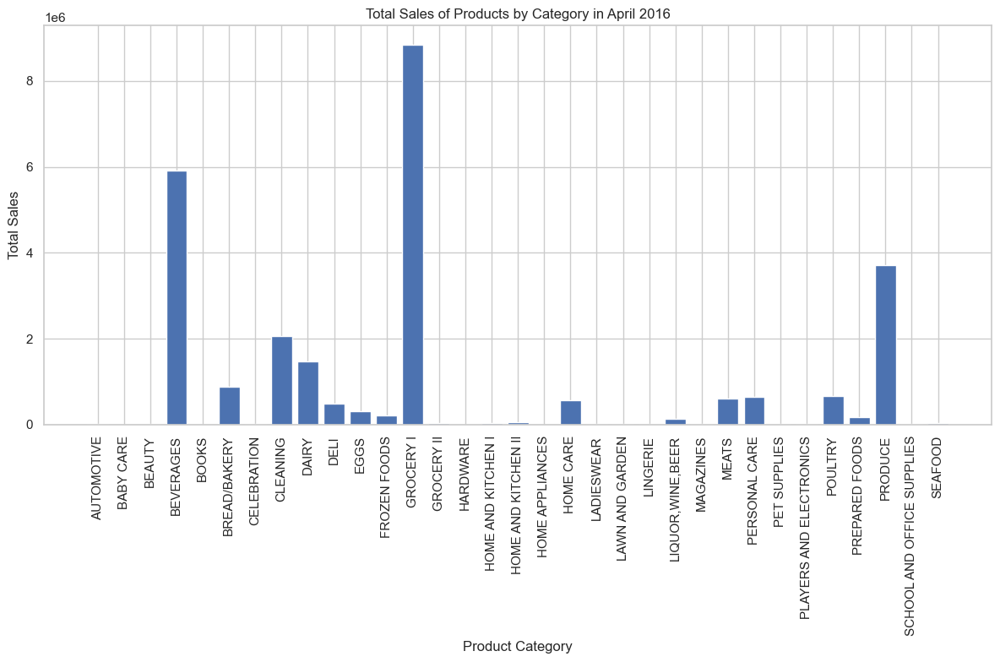

In [72]:

#trainQ.index = pd.to_datetime(trainQ.index)
# Define the date range for the month of the earthquake (April 16, 2016, to April 22, 2016)
start_date = '2016-04-01'
end_date = '2016-04-30'
# Filter your trainQ DataFrame to include only the data for the month of the earthquake
april_2016_data = trainQ[(trainQ.index >= start_date) & (trainQ.index <= end_date)]

# Group the data by 'Product_Category' and calculate the total sales for each category during April 2016
april_2016_stats = april_2016_data.groupby(['Product'])['sales'].sum().reset_index()

# Create a bar plot to visualize the total sales for each product category in April 2016
plt.figure(figsize=(12, 8))
plt.bar(april_2016_stats['Product'], april_2016_stats['sales'])
plt.xlabel('Product Category')
plt.ylabel('Total Sales')
plt.title('Total Sales of Products by Category in April 2016')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


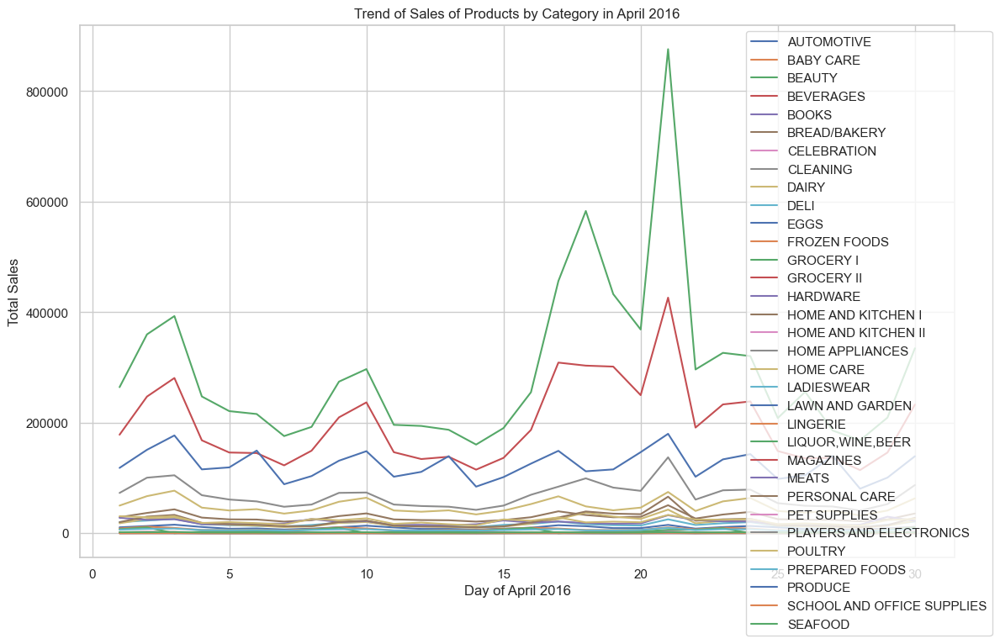

In [73]:
# Convert the 'Year', 'Month', 'Day' columns to integers if they are not already.
trainQ['Year'] = trainQ['Year'].astype(int)
trainQ['Month'] = trainQ['Month'].astype(int)
trainQ['Day'] = trainQ['Day'].astype(int)

# Define the date range for the entire month of April 2016
start_date = '2016-04-01'
end_date = '2016-04-30'

# Filter your trainQ DataFrame to include only the data for April 2016
april_2016_data = trainQ[
    (trainQ['Year'] == 2016) & (trainQ['Month'] == 4)
]

# Group the data by 'Product_Category', 'Year', 'Month', 'Day', and calculate the daily total sales for each category during April 2016
april_2016_stats = april_2016_data.groupby(['Product', 'Year', 'Month', 'Day'])['sales'].sum().reset_index()

# Create a line plot to visualize the trend of sales for each product category in April 2016
plt.figure(figsize=(12, 8))
categories = april_2016_stats['Product'].unique()

for category in categories:
    category_data = april_2016_stats[april_2016_stats['Product'] == category]
    plt.plot(category_data['Day'], category_data['sales'], label=category)

plt.xlabel('Day of April 2016')
plt.ylabel('Total Sales')
plt.title('Trend of Sales of Products by Category in April 2016')
plt.legend(loc='upper right', bbox_to_anchor=(1.05, 1))
plt.grid(True)
plt.tight_layout()
plt.show()


In [74]:
# Convert the 'Year', 'Month', 'Day' columns to integers if they are not already.
trainQ['Year'] = trainQ['Year'].astype(int)
trainQ['Month'] = trainQ['Month'].astype(int)
trainQ['Day'] = trainQ['Day'].astype(int)

# Define the date range for the entire month of April 2016
start_date = '2016-04-01'
end_date = '2016-04-30'

# Filter your trainQ DataFrame to include only the data for April 2016
april_2016_data = trainQ[
    (trainQ['Year'] == 2016) & (trainQ['Month'] == 4)
]

# Group the data by 'Product_Category', 'Year', 'Month', 'Day', and calculate the daily total sales for each category during April 2016
april_2016_stats = april_2016_data.groupby(['Product', 'Year', 'Month', 'Day'])['sales'].sum().reset_index()

# Create a line plot using Plotly to visualize the trend of sales for each product category in April 2016
fig = px.line(april_2016_stats, x='Day', y='sales', color='Product', title='Trend of Sales of Products by Category in April 2016')
fig.update_xaxes(title='Day of April 2016')
fig.update_yaxes(title='Total Sales')
fig.show()


4. Are certain groups of stores selling more products? (Cluster, city, state, type)

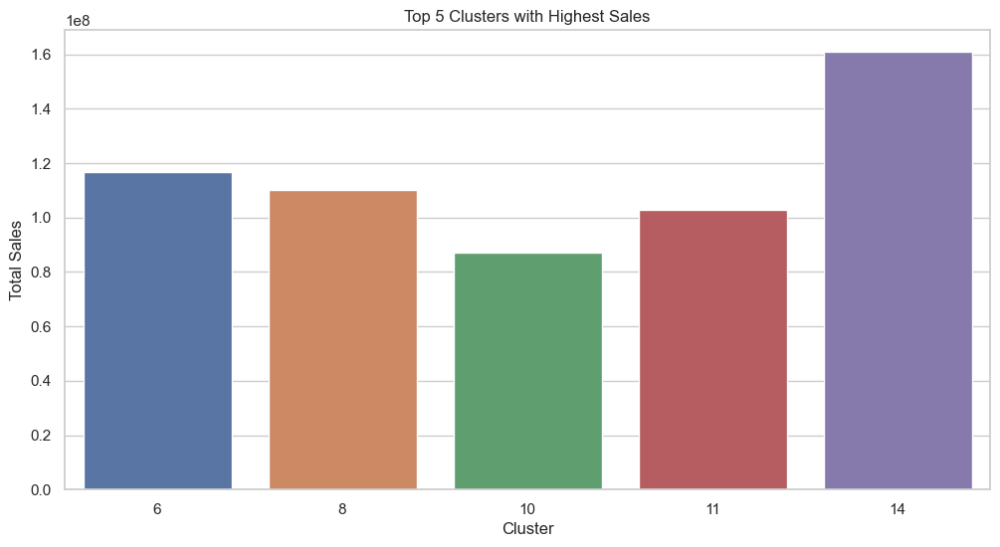

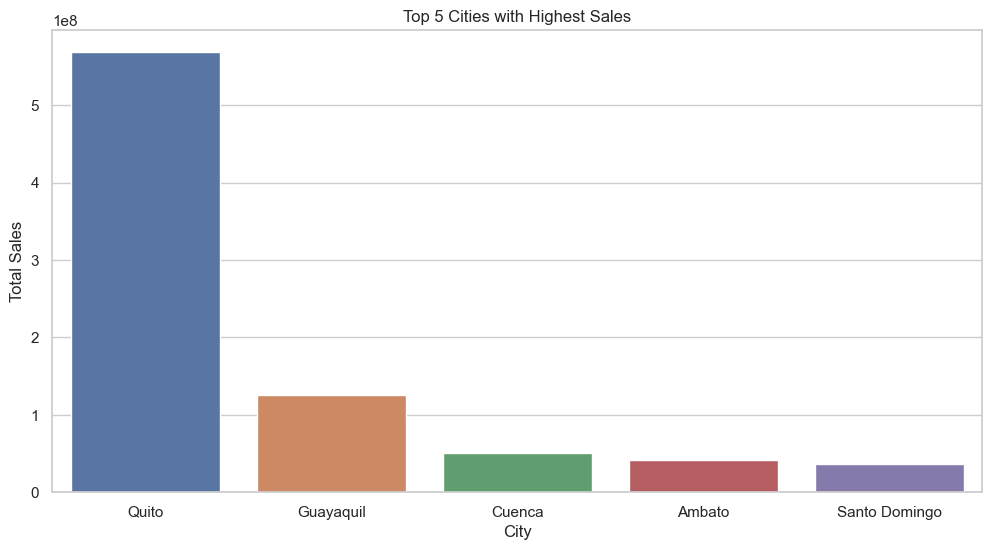

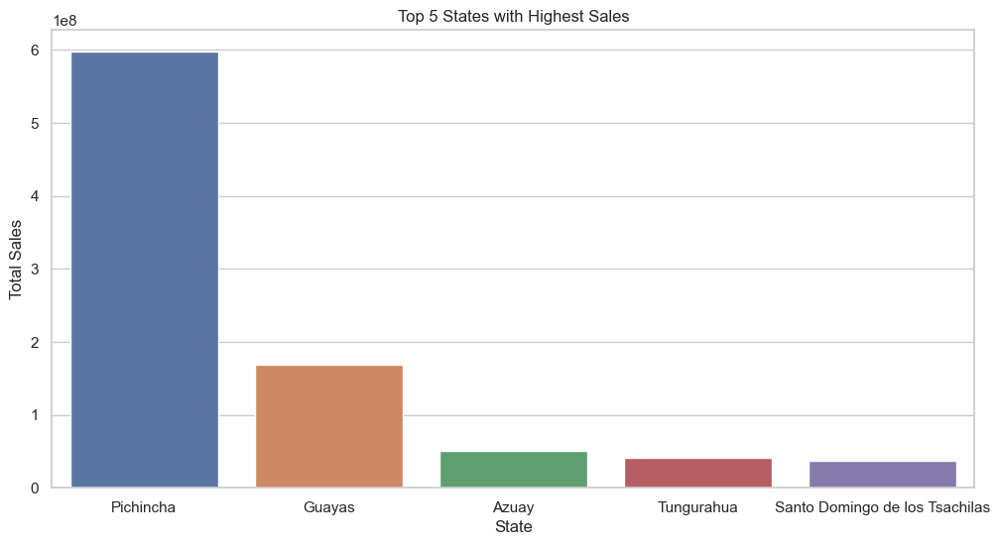

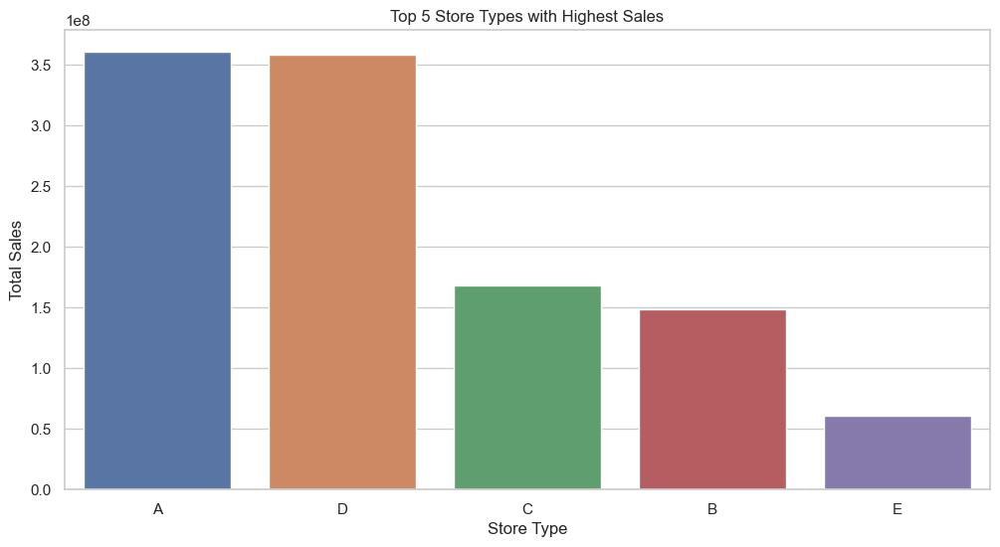

In [75]:
# Data Preparation
relevant_columns = ['sales', 'cluster', 'city', 'state', 'Store Type']
data_subset = trainQ[relevant_columns]

# Aggregate Sales by Group
grouped_data = data_subset.groupby(['cluster', 'city', 'state', 'Store Type'])['sales'].sum().reset_index()
# Sort the grouped data by sales in descending order
sorted_data = grouped_data.sort_values(by='sales', ascending=False)

# Sort the grouped data by sales in descending order and select the top 5 for each category
top_clusters = grouped_data.groupby('cluster')['sales'].sum().nlargest(5).reset_index()
top_cities = grouped_data.groupby('city')['sales'].sum().nlargest(5).reset_index()
top_states = grouped_data.groupby('state')['sales'].sum().nlargest(5).reset_index()
top_store_types = grouped_data.groupby('Store Type')['sales'].sum().nlargest(5).reset_index()

# Plotting the top 5 clusters
plt.figure(figsize=(12, 6))
sns.barplot(x='cluster', y='sales', data=top_clusters, ci=None, estimator=sum)
plt.xlabel('Cluster')
plt.ylabel('Total Sales')
plt.title('Top 5 Clusters with Highest Sales')
plt.show()

# Plotting the top 5 cities
plt.figure(figsize=(12, 6))
sns.barplot(x='city', y='sales', data=top_cities, ci=None, estimator=sum)
plt.xlabel('City')
plt.ylabel('Total Sales')
plt.title('Top 5 Cities with Highest Sales')
plt.show()

# Plotting the top 5 states
plt.figure(figsize=(12, 6))
sns.barplot(x='state', y='sales', data=top_states, ci=None, estimator=sum)
plt.xlabel('State')
plt.ylabel('Total Sales')
plt.title('Top 5 States with Highest Sales')
plt.show()

# Plotting the top 5 store types
plt.figure(figsize=(12, 6))
sns.barplot(x='Store Type', y='sales', data=top_store_types, ci=None, estimator=sum)
plt.xlabel('Store Type')
plt.ylabel('Total Sales')
plt.title('Top 5 Store Types with Highest Sales')
plt.show()


In [76]:
# Group by cluster, city, state, and store type and calculate total sales for each
cluster_sales = trainQ.groupby('cluster')['sales'].sum()
city_sales = trainQ.groupby('city')['sales'].sum()
state_sales = trainQ.groupby('state')['sales'].sum()
store_type_sales = trainQ.groupby('Store Type')['sales'].sum()

# Find the cluster, city, state, and store type with the highest total sales
best_cluster = cluster_sales.idxmax()
best_city = city_sales.idxmax()
best_state = state_sales.idxmax()
best_store_type = store_type_sales.idxmax()

print("Cluster with the highest total sales:", best_cluster)
print("City with the highest total sales:", best_city)
print("State with the highest total sales:", best_state)
print("Store type with the highest total sales:", best_store_type)



Cluster with the highest total sales: 14
City with the highest total sales: Quito
State with the highest total sales: Pichincha
Store type with the highest total sales: A


In [77]:
from scipy.stats import f_oneway

# Perform ANOVA for 'cluster'
anova_result = f_oneway(*[grouped_data[grouped_data['cluster'] == cluster]['sales'] for cluster in grouped_data['cluster'].unique()])
print("Cluster ANOVA Results:")
print(anova_result)
print("\n")  # Line break

# Perform ANOVA for 'city'
anova_result = f_oneway(*[grouped_data[grouped_data['city'] == cluster]['sales'] for cluster in grouped_data['city'].unique()])
print("City ANOVA Results:")
print(anova_result)
print("\n")  # Line break

# Perform ANOVA for 'state'
anova_result = f_oneway(*[grouped_data[grouped_data['state'] == cluster]['sales'] for cluster in grouped_data['state'].unique()])
print("State ANOVA Results:")
print(anova_result)
print("\n")  # Line break

# Perform ANOVA for 'store_type'
anova_result = f_oneway(*[grouped_data[grouped_data['Store Type'] == cluster]['sales'] for cluster in grouped_data['Store Type'].unique()])
print("Store ANOVA Results:")
print(anova_result)


Cluster ANOVA Results:
F_onewayResult(statistic=2.47407622576589, pvalue=0.020563749807501388)


City ANOVA Results:
F_onewayResult(statistic=0.7008030961377021, pvalue=0.7874397560882838)


State ANOVA Results:
F_onewayResult(statistic=1.136538876219933, pvalue=0.37508375270777544)


Store ANOVA Results:
F_onewayResult(statistic=3.933217167377824, pvalue=0.009277673145758893)


 5. Can you identify any trends or patterns in sales for specific product categories within certain store types or clusters

In [78]:
# Convert the 'Year', 'Month', 'Day' columns to integers if they are not already.
trainQ['Year'] = trainQ['Year'].astype(int)
trainQ['Month'] = trainQ['Month'].astype(int)
trainQ['Day'] = trainQ['Day'].astype(int)

# Group the data by 'Product_Category' and 'store_type' and calculate the average sales for each combination
category_store_sales = trainQ.groupby(['Product', 'Store Type'])['sales'].mean().reset_index()

# Create a bar chart using Plotly to visualize the average sales of specific product categories within different store types
fig = px.bar(category_store_sales, x='Product', y='sales', color='Store Type',
             title='Average Sales of Product Categories by Store Type')
fig.update_xaxes(title='Product Category')
fig.update_yaxes(title='Average Sales')
fig.show()




6. How does the price of oil impact sales across different product categories?


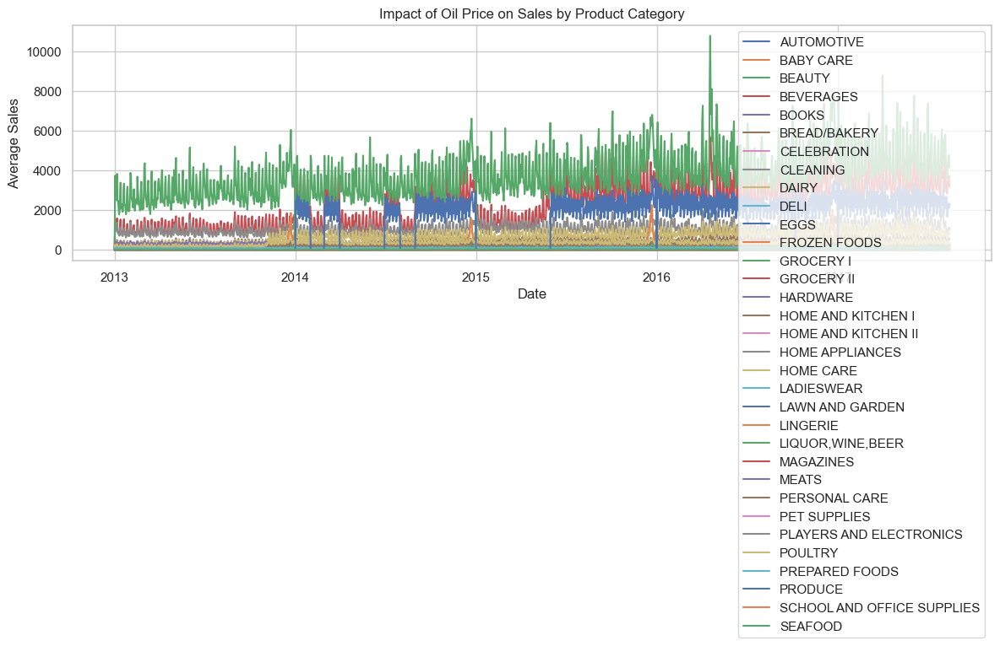

In [79]:
# Group the data by 'date' and 'Product_Category' and calculate the average sales and average oil price for each group
sales_oil_price = trainQ.groupby(['date', 'Product'])[['sales', 'oil price']].mean().reset_index()

# Create a pivot table to have 'Product_Category' as columns, 'date' as index, and 'sales' and 'oil price' as values
pivot_sales_oil_price = sales_oil_price.pivot(index='date', columns='Product', values=['sales', 'oil price'])

# Plot the relationship between oil price and sales for different product categories
plt.figure(figsize=(12, 6))
for category in pivot_sales_oil_price['sales'].columns:
    plt.plot(pivot_sales_oil_price.index, pivot_sales_oil_price['sales'][category], label=category)

plt.xlabel('Date')
plt.ylabel('Average Sales')
plt.title('Impact of Oil Price on Sales by Product Category')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.show()


In [80]:
# Group the data by 'date' and 'Product_Category' and calculate the average sales and average oil price for each group
sales_oil_price = trainQ.groupby(['date', 'Product'])[['sales', 'oil price']].mean().reset_index()

# Create a Plotly line chart to visualize the relationship between oil price and sales for different product categories
fig = px.line(sales_oil_price, x='date', y='sales', color='Product',
              title='Impact of Oil Price on Sales by Product Category',
              labels={'date': 'Date', 'sales': 'Average Sales'})

fig.update_yaxes(title_text='Average Sales')
fig.update_xaxes(title_text='Date')
fig.update_layout(legend_title_text='Product Category')

# Add oil price as a secondary y-axis
fig.add_trace(px.line(sales_oil_price, x='date', y='oil price', color_discrete_sequence=['black']).data[0])

fig.update_yaxes(title_text='Oil Price', secondary_y=True)

fig.show()


In [81]:

from scipy.stats import pearsonr  # Import the pearsonr function from scipy.stats

# Load your trainQ into a DataFrame (assuming you've already done this)
# trainQ = pd.read_csv('your_trainQ.csv')

# Group the data by 'Product_Category' and calculate the Pearson correlation coefficient and p-value for each category
correlation_results = {}
for category in trainQ['Product'].unique():
    category_data = trainQ[trainQ['Product'] == category]
    correlation, p_value = pearsonr(category_data['oil price'], category_data['sales'])
    correlation_results[category] = {'Correlation': correlation, 'P-Value': p_value}

# Create a DataFrame from the correlation results
correlation_df = pd.DataFrame.from_dict(correlation_results, orient='index')

# Filter significant correlations (you can adjust the significance level)
significant_correlations = correlation_df[correlation_df['P-Value'] < 0.05]

# Display the significant correlations
print("Significant Correlations:")
print(significant_correlations)


Significant Correlations:
                            Correlation        P-Value
AUTOMOTIVE                    -0.147987   0.000000e+00
BABY CARE                     -0.123073  3.764950e-309
BEAUTY                        -0.205882   0.000000e+00
BEVERAGES                     -0.320661   0.000000e+00
BOOKS                         -0.090525  1.215110e-167
BREAD/BAKERY                  -0.179134   0.000000e+00
CELEBRATION                   -0.296114   0.000000e+00
CLEANING                      -0.161291   0.000000e+00
DAIRY                         -0.222074   0.000000e+00
DELI                          -0.191962   0.000000e+00
EGGS                          -0.106064  1.042266e-229
FROZEN FOODS                  -0.090024  8.322226e-166
GROCERY I                     -0.197498   0.000000e+00
GROCERY II                    -0.060524   7.554659e-76
HARDWARE                      -0.081364  1.039956e-135
HOME AND KITCHEN I            -0.328235   0.000000e+00
HOME AND KITCHEN II           -0.374417

8. Do promotions have a noticeable effect on sales, and if so, which product categories are most affected?


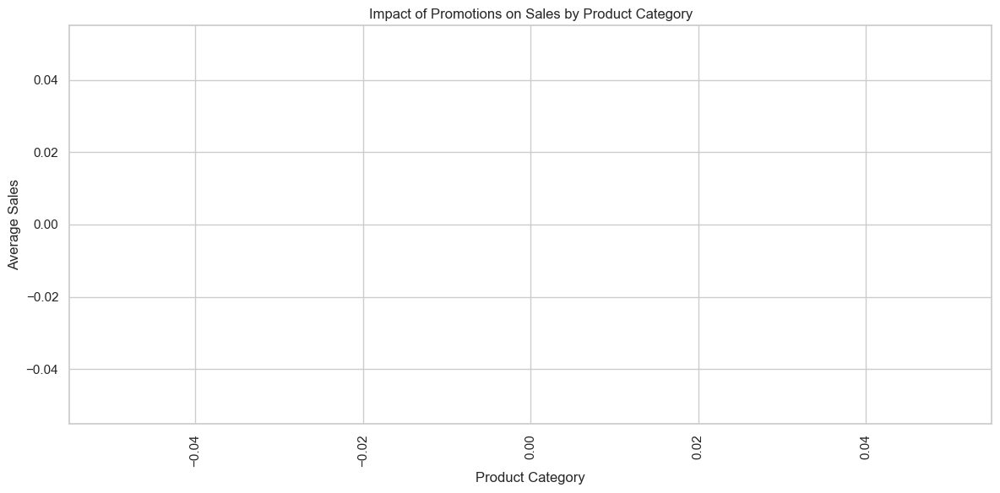

In [82]:
# Group the data by 'onpromotion' (True or False) and 'Product_Category' and calculate the average sales for each group
promotion_sales = trainQ.groupby(['onpromotion', 'Product'])['sales'].mean().reset_index()

# Filter data for products with promotions (onpromotion == True)
promotion_effect = promotion_sales[promotion_sales['onpromotion'] == True]

# Sort by average sales to find the most affected categories
promotion_effect = promotion_effect.sort_values(by='sales', ascending=False)

# Create a bar chart to visualize the impact of promotions on sales by product category
plt.figure(figsize=(12, 6))
plt.bar(promotion_effect['Product'], promotion_effect['sales'])
plt.xlabel('Product Category')
plt.ylabel('Average Sales')
plt.title('Impact of Promotions on Sales by Product Category')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [83]:
# Group the data by 'onpromotion' (True or False) and 'Product_Category' and calculate the average sales for each group
promotion_sales = trainQ.groupby(['onpromotion', 'Product'])['sales'].mean().reset_index()

# Filter data for products with promotions (onpromotion == True)
promotion_effect = promotion_sales[promotion_sales['onpromotion'] == True]

# Sort by average sales to find the most affected categories
promotion_effect = promotion_effect.sort_values(by='sales', ascending=False)

# Create a Plotly bar chart to visualize the impact of promotions on sales by product category
fig = px.bar(promotion_effect, x='Product', y='sales',
             title='Impact of Promotions on Sales by Product Category',
             labels={'Product': 'Product Category', 'sales': 'Average Sales'},
             text='sales')

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Product Category', yaxis_title='Average Sales')

fig.show()


9. Is there a relationship between the type of holiday and sales patterns?

In [84]:
# Convert the 'Year', 'Month', 'Day' columns to integers if they are not already.
trainQ['Year'] = trainQ['Year'].astype(int)
trainQ['Month'] = trainQ['Month'].astype(int)
trainQ['Day'] = trainQ['Day'].astype(int)

# Group the data by 'holiday_type' and calculate the average sales for each type of holiday
holiday_sales_stats = trainQ.groupby(['Holiday Type'])['sales'].mean().reset_index()

# Create a line chart using Plotly to visualize the relationship between holiday types and average sales
fig = px.line(holiday_sales_stats, x='Holiday Type', y='sales', title='Relationship Between Holiday Type and Sales Patterns')
fig.update_xaxes(title='Holiday Type')
fig.update_yaxes(title='Average Sales')
fig.show()


In [85]:
# Convert the 'Year', 'Month', and 'Day' columns to integers if they are not already.
trainQ['Year'] = trainQ['Year'].astype(int)
trainQ['Month'] = trainQ['Month'].astype(int)
# trainQ['2 Weeks'] = trainQ['2 Weeks'].astype(int)
trainQ['Day'] = trainQ['Day'].astype(int)

# Group the data by 'holiday_type' and calculate the average sales for each type of holiday
holiday_sales_stats = trainQ.groupby(['Holiday Type'])['sales'].mean().reset_index()

# Create a bar plot using Plotly to visualize the relationship between holiday types and average sales
fig = px.bar(holiday_sales_stats, x='Holiday Type', y='sales', title='Relationship Between Holiday Type and Sales Patterns')
fig.update_xaxes(title='Holiday Type')
fig.update_yaxes(title='Average Sales')
fig.show()


check sales on transferred holidays

## Hypothesis Testing 

Null Hypothesis (H0):
External factors(such as oil price, holiday and promotion) have no significant impact on retail store sales.

Alternative Hypothesis (H1):
External factors(such as oil price, holiday and promotion) have a significant impact on retail store sales. 

In [89]:
# create a copy of train_data for hypothesis testing 
#train_data_c = train_data.copy()
train_data_c = train_data

In [91]:
train_data_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int8          
 3   Product      object        
 4   sales        float64       
 5   onpromotion  object        
dtypes: datetime64[ns](1), float64(1), int64(1), int8(1), object(2)
memory usage: 117.3+ MB


In [93]:
train_data_c['transferred'].unique()

KeyError: 'transferred'

In [94]:
train_data_c['onpromotion'].unique()

array(['0', '3', '5', '1', '56', '20', '19', '2', '4', '18', '17', '12',
       '6', '7', '10', '9', '50', '8', '16', '42', '51', '13', '15', '47',
       '21', '40', '37', '54', '24', '58', '22', '59', '11', '45', '25',
       '55', '26', '43', '35', '14', '28', '46', '36', '32', '53', '57',
       '27', '39', '41', '30', '29', '49', '23', '48', '44', '38', '31',
       '52', '33', '34', '61', '60', '116', '86', '73', '113', '102',
       '68', '104', '93', '70', '92', '121', '72', '178', '174', '161',
       '118', '105', '172', '163', '167', '142', '154', '133', '180',
       '181', '173', '165', '168', '186', '140', '149', '145', '169',
       '188', '62', '84', '111', '65', '107', '63', '101', '87', '125',
       '94', '114', '171', '153', '170', '166', '141', '155', '179',
       '192', '131', '147', '151', '189', '79', '74', '110', '64', '67',
       '99', '123', '157', '117', '150', '182', '162', '160', '194',
       '135', '190', '69', '108', '89', '126', '156', '103', '146', 

In [95]:
# Assuming train_data contains the 'onpromotion' column with numerical values
# Define bins and labels
bins = [-1, 0, 10, 50, 100, 200, 500, 1000]  # Customize bin edges as needed
labels = ['No Promotion', 'Low Promotion', 'Moderate Promotion', 'High Promotion', 'Very High Promotion', 'Extremely High Promotion', 'Super High Promotion']

# Create a new column 'promotion_category' based on 'onpromotion' values
train_data_c['promotion_category'] = pd.cut(train_data_c['onpromotion'], bins=bins, labels=labels)

# Display the updated train_data
train_data_c.head()



TypeError: '<' not supported between instances of 'int' and 'str'

In [96]:
# Encode the "holiday_type" column
train_data_c_encoded = pd.get_dummies(train_data_c, columns=['holiday_type'], drop_first=True)

# Define your independent variables (external factors)
X = train_data_c_encoded[['oil price', 'onpromotion', 'holiday_type_Holiday']]  # Assuming "oil price" and "onpromotion" are already numerical

# Add a constant term to the independent variables (intercept)
X = sm.add_constant(X)

# Define your dependent variable (sales)
y = train_data_c_encoded['sales']

# Fit a simple linear regression model
model = sm.OLS(y, X).fit()

# Print the regression summary
print(model.summary())



KeyError: "None of [Index(['holiday_type'], dtype='object')] are in the [columns]"

In [97]:
# Assuming you have a DataFrame named train_data with columns 'sales' and 'Month'
# Create a binary column to indicate whether it's April 2016 (earthquake month) or not
train_data_c['is_april_2016'] = np.where((train_data_c['Year'] == 2016) & (train_data_c['Month'] == 4), 1, 0)

# Split the data into two groups: April 2016 and other months
april_2016_sales = train_data_c[train_data_c['is_april_2016'] == 1]['sales']
other_months_sales = train_data_c[train_data_c['is_april_2016'] == 0]['sales']




KeyError: 'Year'

In [98]:
# Perform a t-test
t_statistic, p_value = stats.ttest_ind(april_2016_sales, other_months_sales, equal_var=False)

print (t_statistic)
print (p_value)
# Check the p-value
if p_value < 0.05:  # Use an appropriate significance level
    print("Reject the null hypothesis. The earthquake had a significant impact on sales.")
else:
    print("Fail to reject the null hypothesis. The earthquake had no significant impact on sales.")


NameError: name 'stats' is not defined

## Time Series Decomposition 

Decompose the time series into its components: trend, seasonality, and residual.
This step helps you understand the underlying patterns in the data and can guide your modeling choices.

In [100]:
# Define a function that is responsible for ploting the time series component individually
def decompose(df, column_name):
    """
    Decompose a time series into trend, seasonality, and residual components using both multiplicative and additive models.

    Parameters:
        df (DataFrame): The input DataFrame containing time series data.
        column_name (str): The column name for which trend, seasonality, and residual are to be captured.

    Returns:
        result_mul (seasonal_decompose): Result of the multiplicative decomposition.
        result_add (seasonal_decompose): Result of the additive decomposition.
    """
    # Perform multiplicative decomposition
    result_mul = seasonal_decompose(df.groupby(df['date'])[column_name].sum(), model='multiplicative', extrapolate_trend='freq', period=6)
    
    # Perform additive decomposition
    result_add = seasonal_decompose(df.groupby(df['date'])[column_name].sum(), model='additive', extrapolate_trend='freq', period=6)

    # Set plot size and create subplots
    plt.rcParams.update({'figure.figsize': (18, 10)})
    fig, ax = plt.subplots(4, 2)  # 4 rows, 2 columns for two sets of plots

    # Plot multiplicative decomposition
    result_mul.observed.plot(ax=ax[0, 0])
    result_mul.trend.plot(ax=ax[1, 0])
    result_mul.seasonal.plot(ax=ax[2, 0])
    ax[3, 0].scatter(result_mul.resid.index, result_mul.resid, s=20, marker='o', alpha=0.5)  # Scatter plot for residuals

    # Plot additive decomposition
    result_add.observed.plot(ax=ax[0, 1])
    result_add.trend.plot(ax=ax[1, 1])
    result_add.seasonal.plot(ax=ax[2, 1])
    ax[3, 1].scatter(result_add.resid.index, result_add.resid, s=20, marker='o', alpha=0.5)  # Scatter plot for residuals

    # Set suptitles
    ax[0, 0].set_title('Multiplicative Decompose - Observed')
    ax[0, 1].set_title('Additive Decompose - Observed')
    
    ax[1, 0].set_title('Multiplicative Decompose - Trend')
    ax[1, 1].set_title('Additive Decompose - Trend')
    
    ax[2, 0].set_title('Multiplicative Decompose - Seasonal')
    ax[2, 1].set_title('Additive Decompose - Seasonal')
    
    ax[3, 0].set_title('Multiplicative Decompose - Residual')
    ax[3, 1].set_title('Additive Decompose - Residual')

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Show the plots
    plt.show()

    return result_mul, result_add

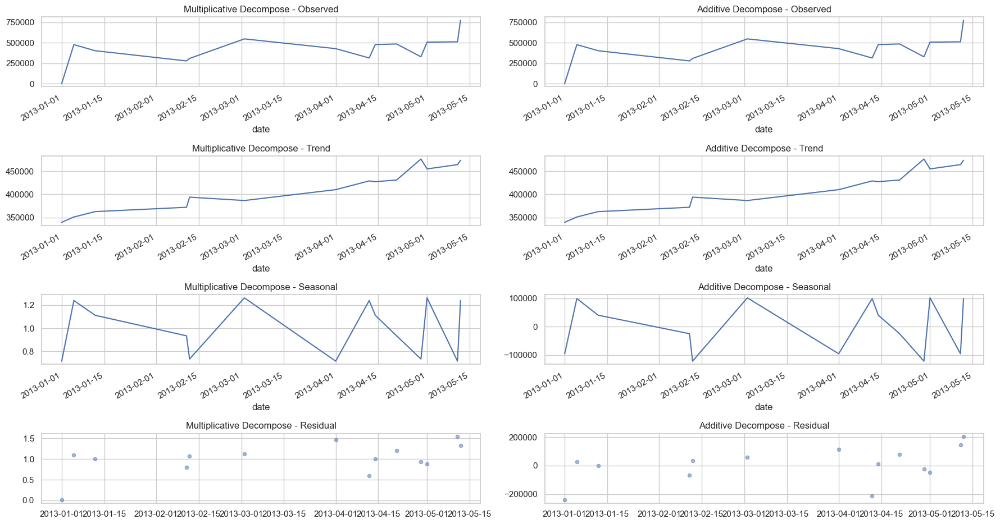

In [101]:
# Generate the various plot by calling the decompose function
result_mul, result_add = decompose(train_mod, 'sales')

In [102]:
# Concatenate the components into a DataFrame
decomposition_df = pd.concat([result_add.seasonal, result_add.trend, result_add.resid, result_add.observed], axis=1)

# Assign column names
decomposition_df.columns = ['seasonal', 'trend', 'residual', 'actual_values']

# View the first 5 rows
decomposition_df.head()

,seasonal,trend,residual,actual_values
date,,,,
2013-01-01,-95433.595623,339330.281544,-241385.066922,2511.618999
2013-01-05,99295.941868,350930.093063,27124.086298,477350.121229
2013-01-12,40567.003572,362529.904582,161.303856,403258.212011
2013-02-11,-24602.558558,371926.325299,-68696.177815,278627.588926
2013-02-12,-121643.113719,393872.131525,36571.773106,308800.790912


### DATA SAMPLING

Due to limited computational resources, we will sample and work with only 40% of the over 3 million data points in the training set, as our current system cannot handle the entire dataset for the testing of stationarity.

In [103]:
# Define a function to perform the sampling
def data_sample(df, size):
    """
    Randomly samples rows from a DataFrame.

    Parameters:
    - df (pd.DataFrame): The input DataFrame from which to sample.
    - size (float): The proportion of rows to sample (e.g., 0.1 for 10%).

    Returns:
    - pd.DataFrame: A randomly sampled subset of the input DataFrame.
    """
    # Set a seed for reproducibility (optional)
    random.seed(42)

    # Calculate the number of rows to sample based on the specified proportion
    sample_size = int(size * len(df))

    # Randomly select rows to create a sample
    sampled_data = df.sample(n=sample_size)

    return sampled_data

In [104]:

# Apply the function to sample the 40%
sampled_train = data_sample(train_mod, 0.2)

In [105]:
# Confirm changes
sampled_train.shape

(4276, 21)

In [106]:
sampled_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4276 entries, 20783 to 4331
Data columns (total 21 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   id            4276 non-null   int64         
 1   date          4276 non-null   datetime64[ns]
 2   store_nbr     4276 non-null   int8          
 3   Product       4276 non-null   object        
 4   sales         4276 non-null   float64       
 5   onpromotion   4276 non-null   int32         
 6   oil price     4276 non-null   float64       
 7   city          4276 non-null   object        
 8   state         4276 non-null   object        
 9   Store Type    4276 non-null   object        
 10  cluster       4276 non-null   int64         
 11  Holiday Type  4276 non-null   object        
 12  locale        4276 non-null   object        
 13  locale_name   4276 non-null   object        
 14  description   4276 non-null   object        
 15  transferred   4276 non-null   object   

In [107]:
# Sales data
time_series = sampled_train['sales']

# Perform the ADF Test with trend and constant
adf_result = adfuller(time_series, regression='ct')

# Perform the KPSS Test with trend and constant
kpss_result = kpss(time_series, regression='ct')

In [108]:
adf_result

(-63.330923711290644,
 0.0,
 0,
 4275,
 {'1%': -3.960889241442155,
  '5%': -3.4115174891618643,
  '10%': -3.127655033766839},
 68890.10895047631)

In [109]:
# Print result of KPSS
kpss_result

(0.07749828657317641,
 0.1,
 8,
 {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})

In [110]:
result = adfuller(sampled_train['sales'])

# Extract and print the p-value
p_value = result[1]
print(f'p-value: {p_value}')

p-value: 0.0


### TEST FOR AUTOCORRELATION

**1. Autocorrelation Function (ACF):**

The ACF measures the correlation between a time series and its lagged values at various time lags. Each point on the ACF plot represents the correlation between the time series and itself at different lags. Here's how to interpret it:

**2. Partial Autocorrelation Function (PACF):**

The PACF, on the other hand, measures the direct relationship between a time series and its lagged values while removing the influence of shorter lags. Here's how to interpret it:

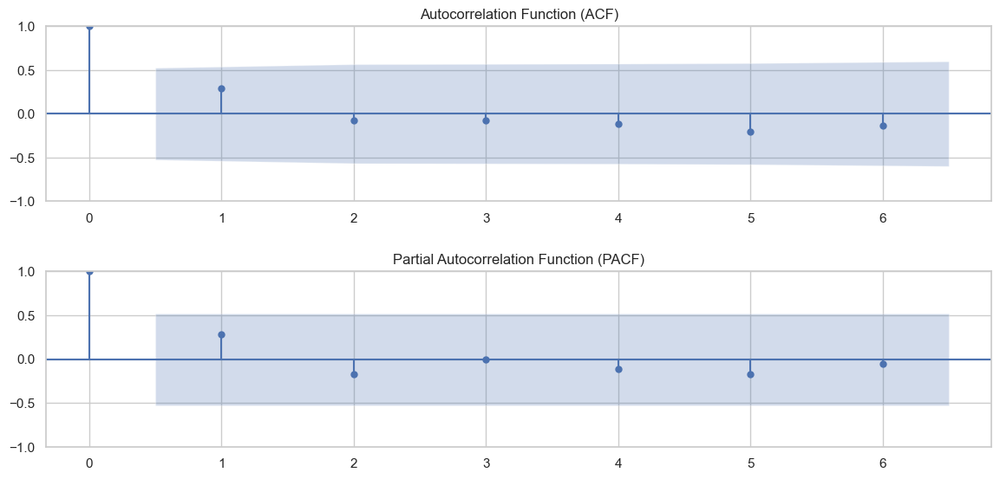

In [111]:
# Get the sales time series data based on the sample
ts = train_data.groupby(train_mod['date'])['sales'].sum()

# Create subplots with 2 rows and 1 column, specifying figsize
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))

# Plot the Autocorrelation Function (ACF) on the first subplot (ax1)
sm.graphics.tsa.plot_acf(ts, lags=6, ax=ax1)
ax1.set_title("Autocorrelation Function (ACF)")  # Add a title to the first subplot

# Plot the Partial Autocorrelation Function (PACF) on the second subplot (ax2)
sm.graphics.tsa.plot_pacf(ts, lags=6, ax=ax2)
ax2.set_title("Partial Autocorrelation Function (PACF)")  # Add a title to the second subplot

# Add padding between the two subplots for better visualization
plt.tight_layout(pad=2.0)

# Display the plots
plt.show()

### Check for Correlation
The correlation matrix provides valuable insights into which columns to include in our sales prediction model. This allows to identifying the most relevant features that can be included in building an accurate forecasting model for future sales.

In [112]:
# Check for linear associations between the variables
correlation_matrix = train_mod.phik_matrix()

interval columns not set, guessing: ['id', 'store_nbr', 'sales', 'onpromotion', 'oil price', 'cluster', 'transactions', 'year', 'month', 'day']


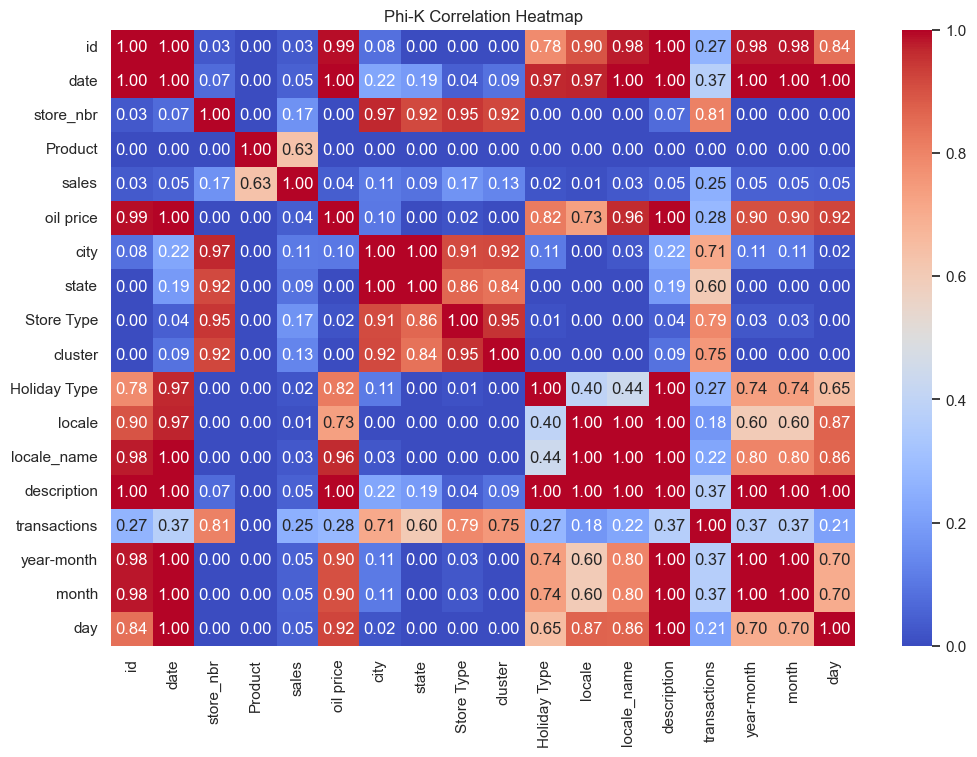

In [113]:
# Plot the correlation matrix
plt.figure(figsize=(12, 8)) # Set the figure size

# Use seaborn to plot the matrix
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm")

# Set the plot title
plt.title("Phi-K Correlation Heatmap")

# Show the plot
plt.show()

### DATA MERGING FOR MODELING AND PREDICTIONS
Given the incomplete nature of the previously used transaction dataset during exploratory data analysis, we will now merge the various datasets once more to ensure a seamless modeling process.

In [114]:
# Merge Stores with Train on store_nbr
train_mac = train_data.merge(stores_data, on='store_nbr', how='left')

In [115]:
# Merge Oil on date
train_mac = train_mac.merge(oil_data, on='date', how='left')

In [116]:
# Merge holidays_events on 'date'
train_mac = train_mac.merge(holi_eve_data, on='date', how='left')

In [117]:
# Convert onpromotion column to numeric
train_mac['onpromotion'] = pd.to_numeric(train_mac['onpromotion'], errors='coerce')

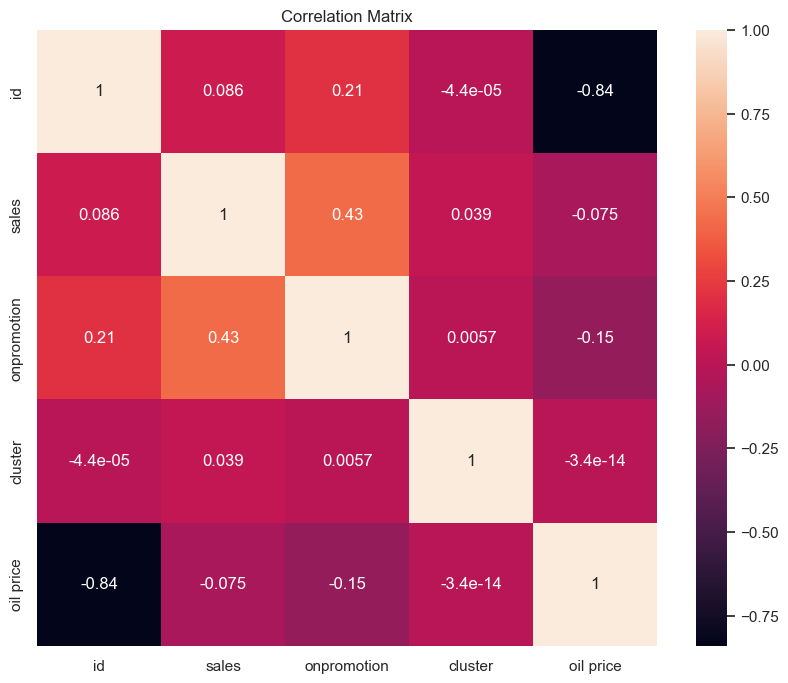

In [118]:
# Calculate the correlation matrix

# Select numeric columns
numeric_df = train_mac.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Create a heatmap of the correlation matrix using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True)
plt.title('Correlation Matrix')
plt.show()

In [119]:
# Set 'id' column as the index
train_mac.set_index('id', inplace=True)

In [120]:
# Columns to drop
columns_to_drop = [ 'city', 'state', 'Store Type', 'oil price', 'Holiday Type', 'locale', 'locale_name', 'transferred']

# Drop the columns
train_mac = train_mac.drop(columns=columns_to_drop)

In [121]:
# Rearrange columns to make 'sales' the last column
cols = [col for col in train_mac.columns if col != 'sales'] + ['sales']
train_mac = train_mac[cols]

In [122]:
train_mac.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3054348 entries, 0 to 3000887
Data columns (total 7 columns):
 #   Column       Dtype         
---  ------       -----         
 0   date         datetime64[ns]
 1   store_nbr    int8          
 2   Product      object        
 3   onpromotion  int64         
 4   cluster      int64         
 5   description  object        
 6   sales        float64       
dtypes: datetime64[ns](1), float64(1), int64(2), int8(1), object(2)
memory usage: 166.0+ MB


In [123]:
# Aggregating data
aggregated_sales = train_mac.groupby(['date', 'store_nbr', 'Product', 'cluster' ]).agg({ 'sales': 'sum' }).reset_index()

In [124]:
# Define the product category groups
groups = {
    'Grocery and Household Essentials': ['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BREAD/BAKERY', 'CLEANING', 'DAIRY', 'EGGS', 'GROCERY I', 'GROCERY II', 'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES', 'HOME CARE', 'PERSONAL CARE', 'PET SUPPLIES', 'SCHOOL AND OFFICE SUPPLIES'],
    'Apparel and Fashion': ['LADIESWEAR', 'LINGERIE'],
    'Entertainment and Leisure': ['BOOKS', 'CELEBRATION', 'MAGAZINES', 'PLAYERS AND ELECTRONICS'],
    'Hardware and Home Improvement': ['HARDWARE', 'LAWN AND GARDEN'],
    'Food and Beverages': ['DELI', 'FROZEN FOODS', 'LIQUOR,WINE,BEER', 'MEATS', 'PREPARED FOODS', 'PRODUCE', 'SEAFOOD']
}

# Create a new column 'Product_Category_Group' based on the mapping
aggregated_sales['Product_Category'] = aggregated_sales['Product'].apply(lambda x: next((group for group, categories in groups.items() if x in categories), 'Other'))


In [125]:
# Check for mising values
aggregated_sales.isnull().sum()

date                0
store_nbr           0
Product             0
cluster             0
sales               0
Product_Category    0
dtype: int64

### FEATURE ENGINEERING

In [126]:
# Create day of the week feature
aggregated_sales['day_of_week'] = aggregated_sales['date'].dt.dayofweek

# Lag sales by 1 to get the previous day sales value
aggregated_sales['lag_1'] = aggregated_sales['sales'].shift(1)

# Add rolling mean with a 7-day window 
aggregated_sales['rolling_mean'] = aggregated_sales['sales'].rolling(window=7).mean()


In [127]:
# Check for mising values
aggregated_sales.isnull().sum()

date                0
store_nbr           0
Product             0
cluster             0
sales               0
Product_Category    0
day_of_week         0
lag_1               1
rolling_mean        6
dtype: int64

In [128]:
# Drop all Missing values introduced due to lag and rolling mean
aggregated_sales.dropna(inplace=True)

#### DATA PREPROCESSING

In [129]:
aggregated_sales.head()

,date,store_nbr,Product,cluster,sales,Product_Category,day_of_week,lag_1,rolling_mean
6,2013-01-01,1,CELEBRATION,13,0.0,Entertainment and Leisure,1,0.0,0.0
7,2013-01-01,1,CLEANING,13,0.0,Grocery and Household Essentials,1,0.0,0.0
8,2013-01-01,1,DAIRY,13,0.0,Grocery and Household Essentials,1,0.0,0.0
9,2013-01-01,1,DELI,13,0.0,Food and Beverages,1,0.0,0.0
10,2013-01-01,1,EGGS,13,0.0,Grocery and Household Essentials,1,0.0,0.0


In [130]:
# Drop the Family column after one hot encoding
aggregated_sales.drop('Product', axis=1, inplace=True)

In [131]:
aggregated_sales

,date,store_nbr,cluster,sales,Product_Category,day_of_week,lag_1,rolling_mean
6,2013-01-01,1,13,0.000,Entertainment and Leisure,1,0.000,0.000000
7,2013-01-01,1,13,0.000,Grocery and Household Essentials,1,0.000,0.000000
8,2013-01-01,1,13,0.000,Grocery and Household Essentials,1,0.000,0.000000
9,2013-01-01,1,13,0.000,Food and Beverages,1,0.000,0.000000
10,2013-01-01,1,13,0.000,Grocery and Household Essentials,1,0.000,0.000000
...,...,...,...,...,...,...,...,...
3000883,2017-08-15,54,3,59.619,Other,1,2.000,71.494429
3000884,2017-08-15,54,3,94.000,Food and Beverages,1,59.619,54.923000
3000885,2017-08-15,54,3,915.371,Food and Beverages,1,94.000,185.404571
3000886,2017-08-15,54,3,0.000,Grocery and Household Essentials,1,915.371,177.141429


### FEATURE ENCODING & FEATURE SCALING 

In [132]:
numeric_features = ['store_nbr', 'cluster', 'sales', 'day_of_week', 'lag_1', 'rolling_mean']
categorical_features = ['Product_Category']

scaler= MinMaxScaler()
encoder= OneHotEncoder()

# Apply to scale the data
aggregated_sales[numeric_features] = scaler.fit_transform(aggregated_sales[numeric_features])

aggregated_sales[categorical_features] = encoder.fit_transform(aggregated_sales[categorical_features])


In [133]:
# Sort the data by date
aggregated_sales = aggregated_sales.sort_values('date')

In [134]:
aggregated_sales

,date,store_nbr,cluster,sales,Product_Category,day_of_week,lag_1,rolling_mean
6,2013-01-01,0.000000,0.7500,0.000000,"(0, 1)\t1.0",0.166667,0.000000,0.000000
1196,2013-01-01,0.679245,0.0625,0.000000,"(0, 3)\t1.0",0.166667,0.000000,0.000000
1195,2013-01-01,0.679245,0.0625,0.000000,"(0, 3)\t1.0",0.166667,0.000000,0.000000
1194,2013-01-01,0.679245,0.0625,0.000000,"(0, 1)\t1.0",0.166667,0.000000,0.000000
1193,2013-01-01,0.679245,0.0625,0.000000,"(0, 3)\t1.0",0.166667,0.000000,0.000000
...,...,...,...,...,...,...,...,...
2999693,2017-08-15,0.320755,0.9375,0.000006,"(0, 3)\t1.0",0.166667,0.000898,0.001664
2999692,2017-08-15,0.320755,0.9375,0.000898,"(0, 3)\t1.0",0.166667,0.000481,0.001680
2999691,2017-08-15,0.320755,0.9375,0.000481,"(0, 2)\t1.0",0.166667,0.000011,0.001703
2999702,2017-08-15,0.339623,0.8750,0.000029,"(0, 3)\t1.0",0.166667,0.000006,0.018358


In [135]:
train_size = int(0.8 * len(aggregated_sales))
train_data = aggregated_sales[:train_size]
test_data = aggregated_sales[train_size:]

In [136]:
# Get the train and the test shapes
train_data.shape, test_data.shape

((2400705, 8), (600177, 8))

In [137]:
# Training set
X_train = train_data.drop(columns=['sales', 'date'])
y_train = train_data['sales']

In [138]:
# Testing set
X_test = test_data.drop(columns=['sales', 'date'])
y_test = test_data['sales']

### MODELING
For the modeling, 4 models will be trained and evaluated using the 20% test set and the best performing model will be considered for hyperparameter tuning and future predictions. These are:

1. **ARIMA (AutoRegressive Integrated Moving Average)**:
   ARIMA is a time series forecasting model that combines autoregressive (AR) and moving average (MA) components to make predictions. It is suitable for univariate time series data and can capture trends and seasonality in the data. ARIMA requires the data to be stationary.

2. **SARIMA (Seasonal AutoRegressive Integrated Moving Average)**:
   SARIMA is an extension of the ARIMA model that takes into account seasonal patterns in time series data. It includes seasonal AR and MA terms to capture recurring patterns over time. SARIMA is useful for this analysis since the data exhibits seasonal trends.

3. **Exponential Smoothing**:
   Exponential smoothing is a time series forecasting method that assigns exponentially decreasing weights to past observations. Exponential smoothing methods include simple exponential smoothing, Holt's linear exponential smoothing, and Holt-Winters exponential smoothing, which handles seasonality.

4. **XGBoost (Extreme Gradient Boosting)**:
   XGBoost is a powerful ensemble learning algorithm that builds an ensemble of decision trees and optimizes their weights to make accurate predictions. It often performs well in predictive modeling tasks such as time series forcsting.

In [139]:
# Define a custom color palette
custom_color_palette = ["#835AF1", "#37AA9C", "#B8F7D4", "#94F3E4"]

# Define a function to plot the predictions aganist the actuals
def plot_predictions(date, y_test, y_pred, forecast_label, title):
    """
    Plot the actual and predicted time series data.

    Parameters:
    date (array-like): Date or time index.
    y_test (array-like): Actual values.
    y_pred (array-like): Predicted values.
    forecast_label (str): Label for the forecasted data.
    title (str): Title for the plot.
    """
    # Set the custom color palette
    sns.set_palette(custom_color_palette)
    
    # Create a figure with specified dimensions
    plt.figure(figsize=(10, 6))

    # Plot the actual data in green
    sns.lineplot(x=date, y=y_test, label='Actual', color=custom_color_palette[0])

    # Plot the predicted data in blue with the specified label
    sns.lineplot(x=date, y=y_pred, label=forecast_label, color=custom_color_palette[1])

    # Add a legend to the plot
    plt.legend()

    # Set the title of the plot
    plt.title(title)

    # Display the plot
    plt.show()

In [140]:
# Define a function to compute the evaluations metrics after the forecast
def evaluate_forecast(y_test, forecast):
    """
    Compute MSE, RMSE, and RMSLE for a forecast.

    Parameters:
    y_test (array-like): Actual values.
    forecast (array-like): Predicted values.

    Returns:
    dict: Dictionary containing MSE, RMSE, and RMSLE.
    """
    def rmsle(predicted, actual):
        return np.sqrt(np.mean(np.square(np.log1p(predicted) - np.log1p(actual))))

    # Compute Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, forecast)
    
    # Compute Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)
    
    # Compute Root Mean Squared Logarithmic Error (RMSLE)
    rmsle_value = rmsle(forecast, y_test)
    
    # Return the evaluation metrics as a dictionary
    metrics = {
        'MSE': mse,
        'RMSE': rmse,
        'RMSLE': rmsle_value
    }
    
    return metrics

In [141]:
# Exogenous variables to help predict sales
ex_variables = ['day_of_week', 'lag_1', 'rolling_mean']

### ARIMA MODEL

In [142]:
# Define Instance of the Model
model_arima = sm.tsa.ARIMA(y_train, exog=X_train[ex_variables], order=(1,0,0))

# Fit the Model
results_arima = model_arima.fit()

# Make Predictions
forecast_arima = results_arima.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1, exog=X_test[ex_variables])

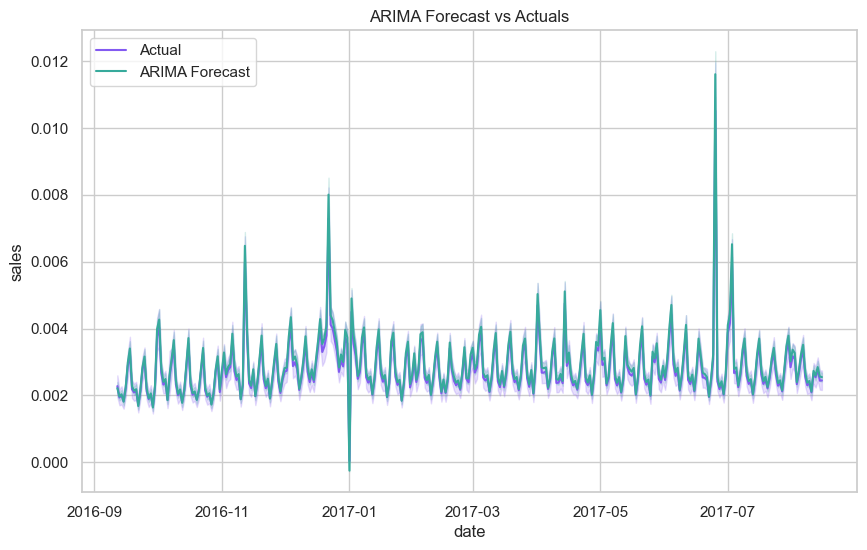

In [143]:
# Apply the function to plot the predictions vs actual
plot_predictions(test_data['date'],y_test, forecast_arima, 'ARIMA Forecast', 'ARIMA Forecast vs Actuals')

In [144]:
# Calcualte the metrics
arima_metrics = evaluate_forecast(y_test, forecast_arima)

# Print out
arima_metrics

{'MSE': 4.719899248379452e-05,
 'RMSE': 0.006870152289709051,
 'RMSLE': 0.008989737904720045}

### EXPONENTIAL SMOOTHING MODEL

In [145]:
# Define Instance of the Exponential Smoothing model
model_ets = ExponentialSmoothing(y_train, seasonal='add', seasonal_periods=12)

# Fit the Model
results_ets = model_ets.fit()

# Make Initial Forecast
initial_forecast = results_ets.forecast(steps=len(y_test))

In [146]:
# Use initial forecast obtained and exogenous Variables defined to predict y_test.
X_adjust_train = pd.concat([y_train.shift(-1).dropna().rename("forecast"), X_train[ex_variables].iloc[1:, :]], axis=1)
X_adjust_test = pd.concat([pd.Series(initial_forecast, index=y_test.index).rename("forecast"), X_test[ex_variables]], axis=1)

# Drop rows with missing values from both the adjusted train and test
X_adjust_train = X_adjust_train.dropna()
y_adjust_train = y_train.loc[X_adjust_train.index]

X_adjust_test = X_adjust_test.dropna()
y_adjust_test = y_test.loc[X_adjust_test.index]

# Convert feature names to strings
X_adjust_train.columns = X_adjust_train.columns.astype(str)
X_adjust_test.columns = X_adjust_test.columns.astype(str)

In [147]:
# Define Linear Regression Model
lr = LinearRegression()

# Fit the model
lr.fit(X_adjust_train, y_adjust_train)

# Predict based on the X_adjusted_test
forecast_ets = lr.predict(X_adjust_test)

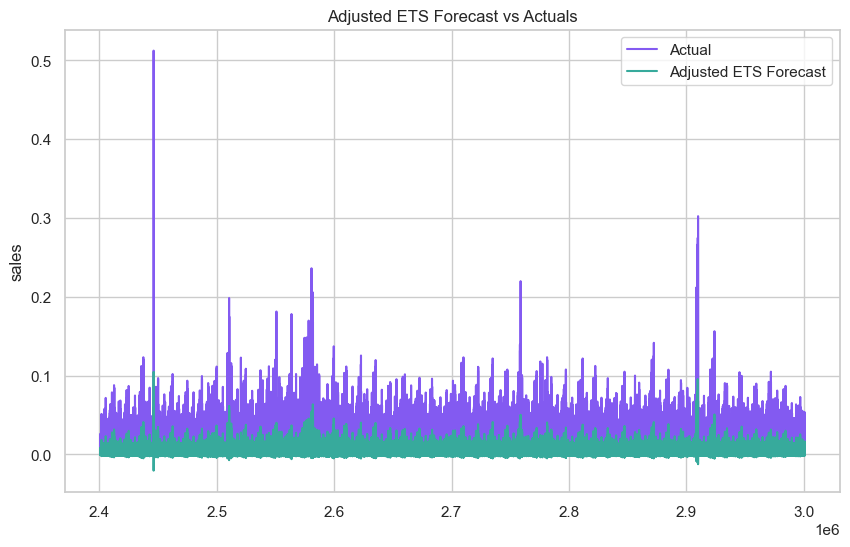

In [148]:
# Apply the function to plot the predictions vs actual
plot_predictions(y_adjust_test.index,y_adjust_test, forecast_ets, 'Adjusted ETS Forecast', 'Adjusted ETS Forecast vs Actuals')

In [149]:
# Calcualte the metrics
ets_metrics = evaluate_forecast(y_adjust_test, forecast_ets)

# Print out
ets_metrics

{'MSE': 4.72453454391587e-05,
 'RMSE': 0.00687352496461304,
 'RMSLE': 0.0066784353567664895}

### XGBOOST REGRESSOR MODEL

In [150]:
model_xgb = xgb.XGBRegressor(objective='reg:squarederror')
model_xgb.fit(X_train, y_train)
forecast_xgb = model_xgb.predict(X_test)


ValueError: DataFrame.dtypes for data must be int, float, bool or category. When categorical type is supplied, The experimental DMatrix parameter`enable_categorical` must be set to `True`.  Invalid columns:Product_Category: object

In [ ]:
# Apply the function to plot the predictions vs actual
plot_predictions(test_data['date'],y_test, forecast_xgb, 'XGBoost Forecast', 'XGBoost Forecast vs Actuals')

In [ ]:
# Calcualte the metrics
XGB_metrics = evaluate_forecast(y_test, forecast_xgb)

# Print out
XGB_metrics

In [ ]:


# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, predicted)
print(f'Mean Squared Error (MSE): {mse:.4f}')

# Calculate Root Mean Squared Error (RMSE)
rmse = math.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')

# Calculate Root Mean Squared Logarithmic Error (RMSLE)
rmsle = math.sqrt(mean_squared_error(np.log1p(y_test), np.log1p(predicted)))
print(f'Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.4f}')


### SIMPLE EXPSMOOTHING MODEL

In [ ]:


# Extract the 'sales' column as a time series
train_sales = train_data['sales']
test_sales = test_data['sales']

# Initialize and fit the SES model on the training data
ses_model = SimpleExpSmoothing(train_sales)
ses_fit = ses_model.fit()

# Make predictions on the testing data
ses_forecast = ses_fit.forecast(len(test_sales))

# Calculate RMSE (Root Mean Squared Error) for the SES model
rmse_ses = sqrt(mean_squared_error(test_sales, ses_forecast))
print(f'Root Mean Squared Error (RMSE) for SES Model: {rmse_ses:.4f}')

# Visualize the actual sales and SES forecasts
plt.figure(figsize=(12, 6))
plt.plot(test_data['date'], test_sales, label='Actual Sales', color='blue')
plt.plot(test_data['date'], ses_forecast, label='SES Forecast', color='red')
plt.title('Sales Forecasting with SES Model')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()


In [ ]:
# Calcualte the metrics
SES_metrics = evaluate_forecast(y_test, ses_forecast)

# Print out
SES_metrics

In [ ]:
# Create a Dictionary to combine all the results of the models
data = {
    'Model': ['ARIMA', 'SES', 'ETS', 'XGBOOST'],
    'MSE': [arima_metrics['MSE'], SES_metrics['MSE'], ets_metrics['MSE'], XGB_metrics['MSE']],
    'RMSE': [arima_metrics['RMSE'], SES_metrics['RMSE'], ets_metrics['RMSE'], XGB_metrics['RMSE']],
    'RMSLE': [arima_metrics['RMSLE'], SES_metrics['RMSLE'], ets_metrics['RMSLE'], XGB_metrics['RMSLE']]
}

# Create a Performance df
performance_df = pd.DataFrame(data)

# Display
performance_df

1. **MSE (Mean Squared Error)**: MSE measures the average squared difference between the predicted values and the actual values. It is commonly used to evaluate regression models. A lower MSE indicates a better fit to the data.

2. **RMSE (Root Mean Squared Error)**: RMSE is the square root of the MSE. It provides a measure of the average magnitude of the errors in the same units as the target variable. Like MSE, lower RMSE values indicate better model performance.

3. **RMSLE (Root Mean Squared Logarithmic Error)**: RMSLE is a variation of RMSE that is often used when dealing with skewed or non-normally distributed target variables. It calculates the RMSE of the logarithm of the predicted and actual values. RMSLE is particularly useful when the target variable has a wide range, and the errors are expected to be proportional to the actual values. Lower RMSLE values indicate better performance, similar to RMSE.

Now, MAE (Mean Absolute Error) is greater than all of these metrics because MAE measures the average absolute difference between the predicted values and the actual values. It is less sensitive to outliers compared to MSE and RMSE. In some cases, MAE can be greater than MSE and RMSE because it does not penalize larger errors as significantly.

In [ ]:
# Plot the performance 
fig = px.bar(performance_df, x='Model', y='RMSLE', title='RMSLE by Model', height=600)
fig.update_xaxes(title='Model')
fig.update_yaxes(title='RMSLE')
fig.update_xaxes(categoryorder='total ascending')

# Add data labels on top of the bars
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Show plot
fig.show()

# HYPERPARAMETER TUNING
In pursuit of further enhancing the performance of our XGBoost model, we will be conducting hyperparameter tuning. Specifically, we will utilize a randomized search approach. This process aims to fine-tune the model's hyperparameters, optimizing its predictive capabilities and potentially yielding even better results.

In [ ]:
# Params
xgb_param_dist = {
    'learning_rate': [0.01, 0.1, 0.3],
    'n_estimators': [50, 100, 200],
    'max_depth': [2, 4, 6]
}

# Model Instance
model_xgb = xgb.XGBRegressor(objective='reg:squarederror')

# Perform the search
random_search = RandomizedSearchCV(
    model_xgb,
    param_distributions=xgb_param_dist,
    n_iter=10,  # Number of iterations as needed
    cv=5,       # Number of cross-validation folds
    scoring='neg_mean_squared_error',
    random_state=42
)

# Fit the model
random_search.fit(X_train, y_train)

# Get the best params
best_xgb_params = random_search.best_params_

# Print out
print("Best XGBoost parameters:", best_xgb_params)

# Get best estimator
best_xgb_model = random_search.best_estimator_

# Print out
best_xgb_model

In [ ]:
# Prediction with the best model
forecast_xgb_best = best_xgb_model.predict(X_test)

In [ ]:


# Plot the actual data (y_test) in blue
plt.plot(y_test.index, y_test, label='Actual', color='blue')

# Plot the predicted data (forecast_xgb_best) in red
plt.plot(y_test.index, forecast_xgb_best, label='Predicted', color='red')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Sales')  # Adjust this label based on your specific data
plt.title('Actual vs. Predicted Sales')

# Add a legend
plt.legend()

# Show the plot
plt.show()


In [ ]:


# Assuming forecast_xgb_best is a NumPy array or list of forecasted values
forecast_data = pd.DataFrame({'Date': X_test.index, 'Predicted_Sales': forecast_xgb_best})

# Optionally, you can set the 'Date' column as the index if it's not already
# forecast_data.set_index('Date', inplace=True)

# Print or display the forecast data
forecast_data
